# Import libraries

In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

In [3]:
print(torch.__version__)

1.8.1+cu102


In [4]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

# Build generator

In [5]:
def get_generator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

In [6]:
class Generator(nn.Module):
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
        
    def forward(self, noise):
        return self.gen(noise)
    

# Get Noise

In [7]:
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples, z_dim, device=device)

# Build Discriminator

In [8]:
def get_discriminator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
        
    )

In [9]:
class Discriminator(nn.Module):
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        return self.disc(image)

# Traning Parameters

In [10]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cpu'

# Load Dataset

In [14]:
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('..', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

# Initiate the two models

In [15]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

# Get Disc Loss

In [16]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    noise = get_noise(num_images, z_dim, device=device)
    xFake = gen(noise).detach()
    
    yFakePredicted = disc(xFake)
    yFakeLabel = torch.zeros_like(yFakePredicted)
    lossFake = criterion(yFakePredicted, yFakeLabel)
    
    yRealPredicted = disc(real)
    yRealLabel = torch.ones_like(yRealPredicted)
    lossReal = criterion(yRealPredicted, yRealLabel)
    
    disc_loss = (lossFake + lossReal)/2
    return disc_loss

# Get Gen Loss

In [17]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    noise = get_noise(num_images, z_dim, device=device)
    xFake = gen(noise)
    
    yFakePredicted = disc(xFake)
    
    yFakeLabel = torch.ones_like(yFakePredicted)
    gen_loss = criterion(yFakePredicted, yFakeLabel)

    return gen_loss

# Training

In [18]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False

  6%|▋         | 30/469 [00:01<00:17, 25.07it/s]

Step 500: Generator loss: 1.3889945441484455, discriminator loss: 0.4190557031035428


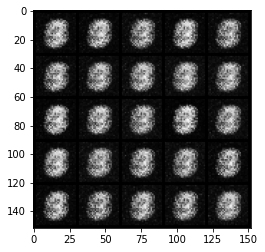

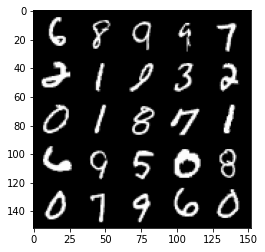

 13%|█▎        | 60/469 [00:02<00:15, 26.94it/s]

Step 1000: Generator loss: 1.674294235944748, discriminator loss: 0.29983677530288677


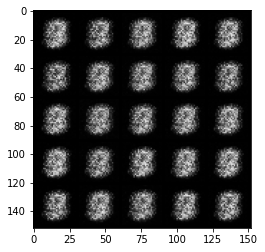

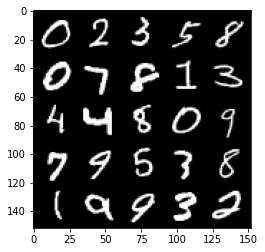

 20%|█▉        | 93/469 [00:03<00:13, 27.57it/s]

Step 1500: Generator loss: 1.969119774341584, discriminator loss: 0.1734056856036187


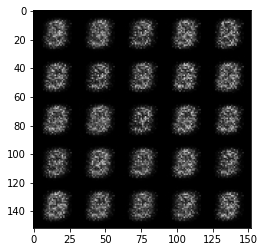

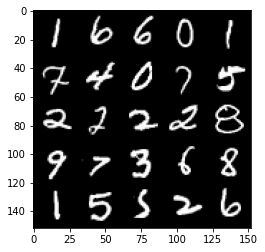

 26%|██▌       | 122/469 [00:04<00:12, 28.62it/s]

Step 2000: Generator loss: 1.792784410238267, discriminator loss: 0.1912313927412034


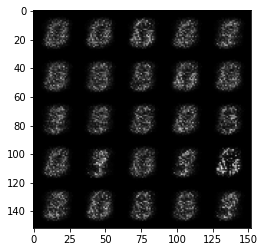

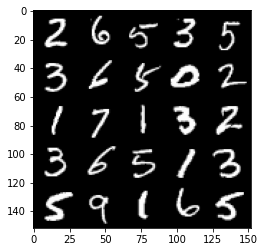

 33%|███▎      | 154/469 [00:05<00:11, 26.45it/s]

Step 2500: Generator loss: 1.7462612311840042, discriminator loss: 0.19203136973083015


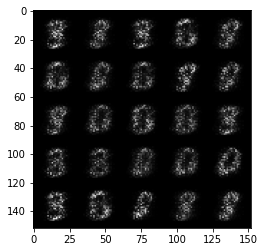

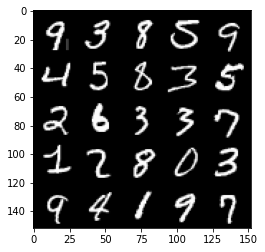

 40%|███▉      | 186/469 [00:07<00:11, 25.23it/s]

Step 3000: Generator loss: 2.029026225566864, discriminator loss: 0.14821363236010066


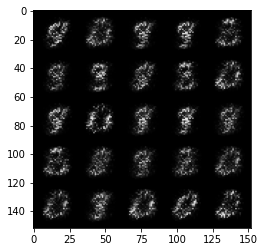

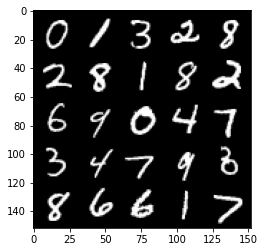

 46%|████▌     | 216/469 [00:08<00:10, 25.24it/s]

Step 3500: Generator loss: 2.4271524500846864, discriminator loss: 0.12464641134440897


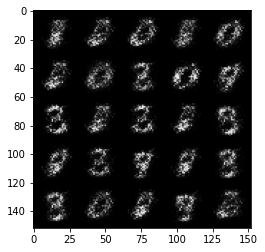

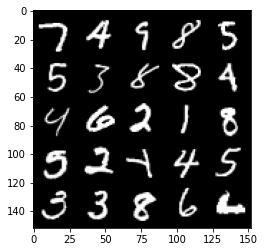

 52%|█████▏    | 246/469 [00:09<00:07, 28.00it/s]

Step 4000: Generator loss: 2.663868720531465, discriminator loss: 0.12261743479967122


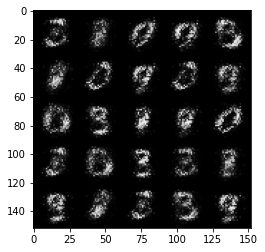

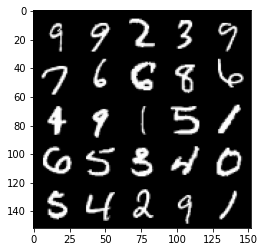

 59%|█████▉    | 279/469 [00:10<00:06, 27.79it/s]

Step 4500: Generator loss: 3.0483886971473706, discriminator loss: 0.10673007205128682


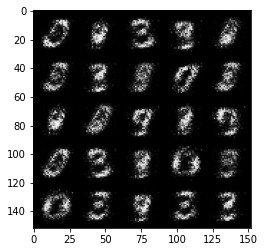

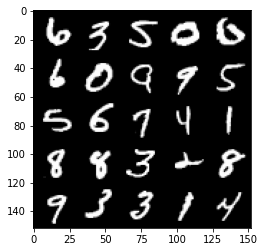

 66%|██████▌   | 309/469 [00:11<00:06, 25.35it/s]

Step 5000: Generator loss: 3.406960364341736, discriminator loss: 0.08293644510209555


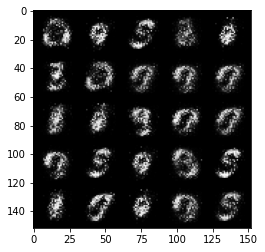

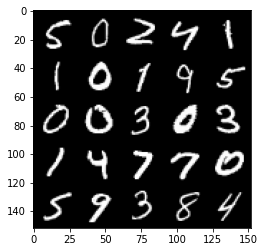

 72%|███████▏  | 339/469 [00:14<00:05, 23.20it/s]

Step 5500: Generator loss: 3.551601017475127, discriminator loss: 0.08152312180399891


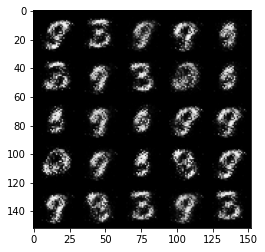

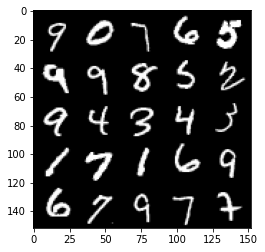

 79%|███████▉  | 370/469 [00:15<00:03, 27.31it/s]

Step 6000: Generator loss: 3.4986797480583185, discriminator loss: 0.08184422364085915


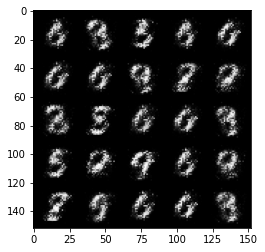

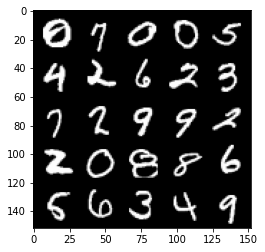

 86%|████████▌ | 403/469 [00:15<00:03, 20.92it/s]

Step 6500: Generator loss: 3.684422129631042, discriminator loss: 0.06148006998002523


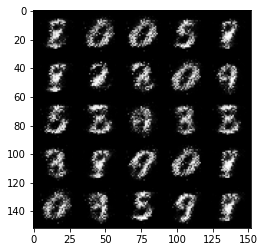

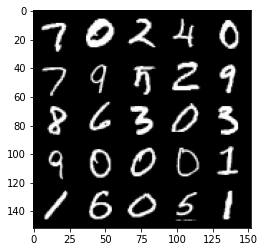

 92%|█████████▏| 432/469 [00:17<00:01, 25.06it/s]

Step 7000: Generator loss: 3.912632483482361, discriminator loss: 0.05369967018812896


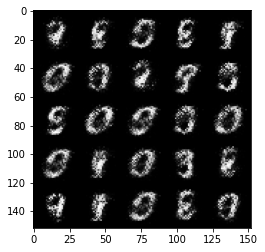

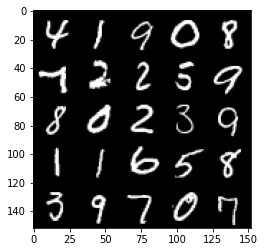

 99%|█████████▉| 464/469 [00:20<00:00, 24.78it/s]

Step 7500: Generator loss: 3.987800115108491, discriminator loss: 0.06136100269854068


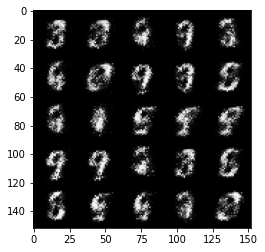

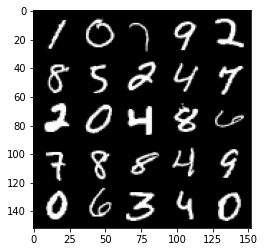

  6%|▌         | 27/469 [00:01<00:16, 26.41it/s]

Step 8000: Generator loss: 3.9370167622566217, discriminator loss: 0.06665017267316575


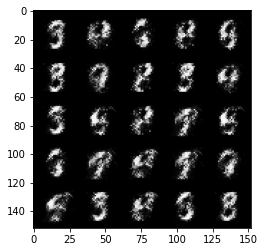

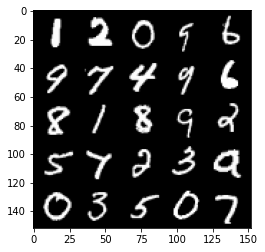

 12%|█▏        | 57/469 [00:02<00:16, 24.57it/s]

Step 8500: Generator loss: 3.993744966983799, discriminator loss: 0.05413496986404062


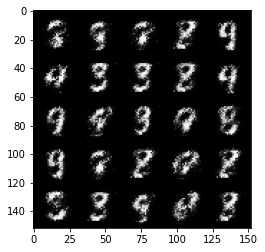

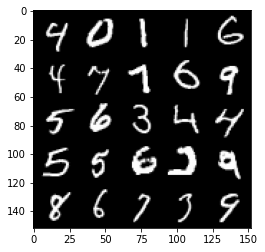

 19%|█▊        | 87/469 [00:03<00:14, 26.63it/s]

Step 9000: Generator loss: 4.127220700263977, discriminator loss: 0.05034463128075003


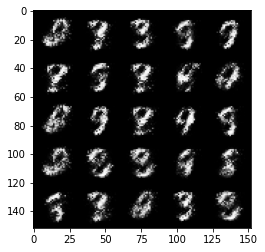

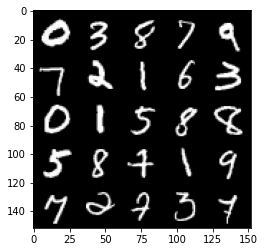

 25%|██▌       | 118/469 [00:04<00:12, 27.86it/s]

Step 9500: Generator loss: 3.890482779979706, discriminator loss: 0.06318814300745722


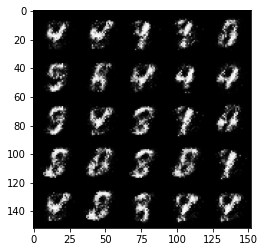

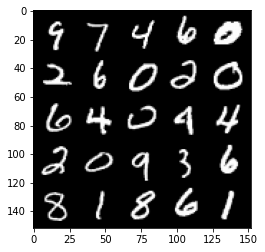

 32%|███▏      | 149/469 [00:06<00:13, 24.03it/s]

Step 10000: Generator loss: 4.078982434272764, discriminator loss: 0.0608420387357474


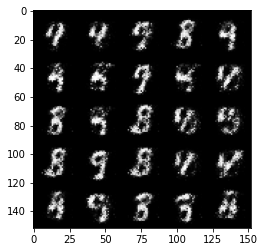

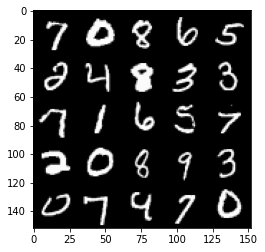

 38%|███▊      | 180/469 [00:07<00:11, 25.88it/s]

Step 10500: Generator loss: 3.9155247163772584, discriminator loss: 0.0690967784449458


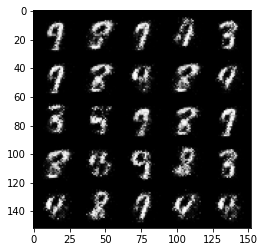

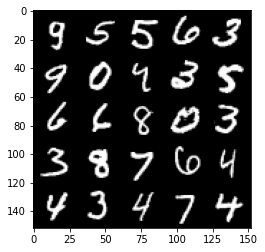

 45%|████▌     | 213/469 [00:08<00:09, 26.23it/s]

Step 11000: Generator loss: 3.7716676330566417, discriminator loss: 0.07543704035878186


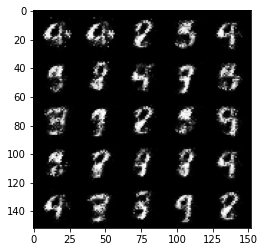

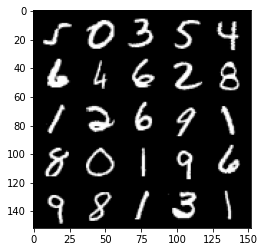

 52%|█████▏    | 243/469 [00:09<00:08, 27.02it/s]

Step 11500: Generator loss: 3.717268279552459, discriminator loss: 0.09160796374082558


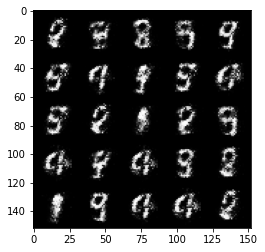

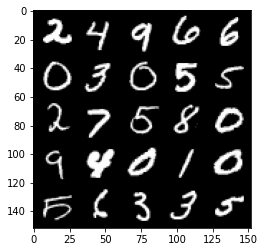

 58%|█████▊    | 274/469 [00:10<00:07, 26.48it/s]

Step 12000: Generator loss: 3.813017961025239, discriminator loss: 0.07804647922515873


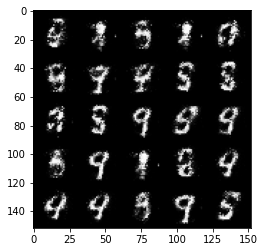

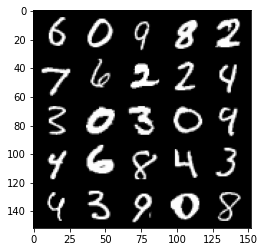

 65%|██████▌   | 306/469 [00:11<00:05, 27.27it/s]

Step 12500: Generator loss: 3.851463514328005, discriminator loss: 0.07808493662625554


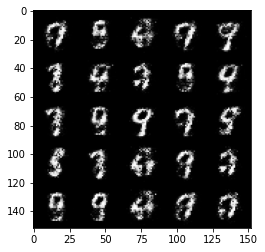

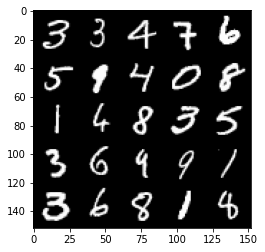

 71%|███████▏  | 335/469 [00:12<00:04, 27.62it/s]

Step 13000: Generator loss: 3.725596021175387, discriminator loss: 0.0912387856319546


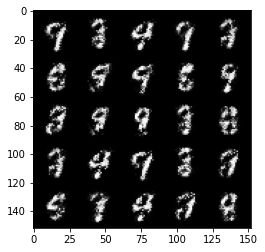

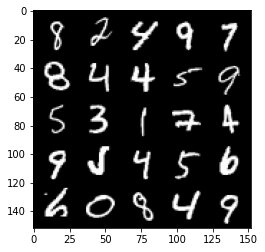

 78%|███████▊  | 367/469 [00:13<00:03, 26.86it/s]

Step 13500: Generator loss: 3.867204995632173, discriminator loss: 0.09418770809471597


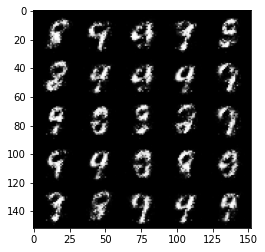

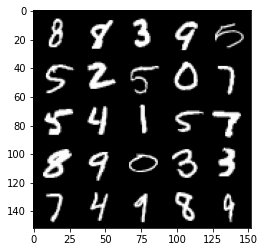

 85%|████████▍ | 397/469 [00:14<00:02, 26.13it/s]

Step 14000: Generator loss: 3.868628349304197, discriminator loss: 0.08530276365578172


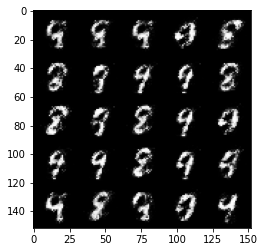

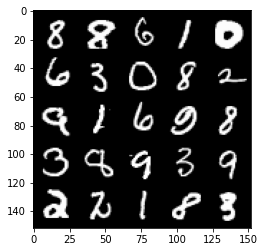

 91%|█████████▏| 429/469 [00:15<00:01, 27.92it/s]

Step 14500: Generator loss: 3.5435791788101225, discriminator loss: 0.10092260196804992


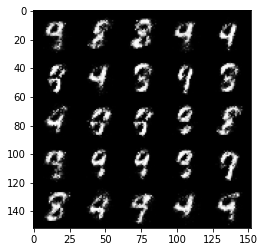

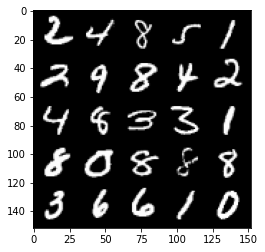

 98%|█████████▊| 460/469 [00:17<00:00, 27.86it/s]

Step 15000: Generator loss: 3.5520094165801996, discriminator loss: 0.11407627357542509


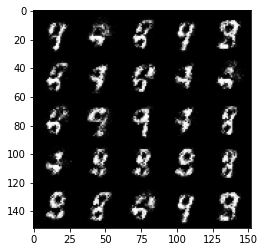

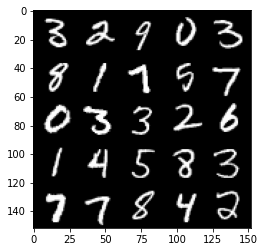

  4%|▍         | 21/469 [00:00<00:16, 27.25it/s]

Step 15500: Generator loss: 3.4374100122451767, discriminator loss: 0.12141572127491243


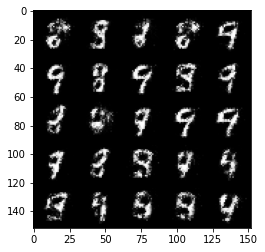

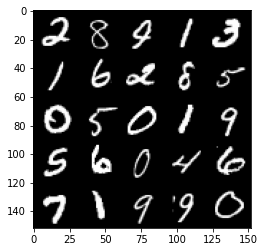

 12%|█▏        | 54/469 [00:02<00:15, 26.84it/s]

Step 16000: Generator loss: 3.432921431064609, discriminator loss: 0.12151129163056616


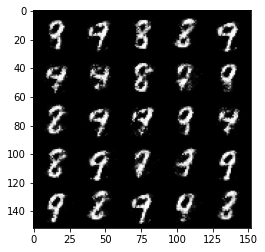

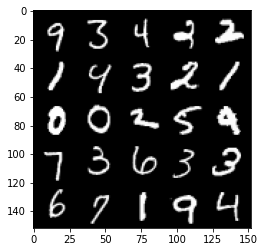

 18%|█▊        | 84/469 [00:03<00:14, 26.21it/s]

Step 16500: Generator loss: 3.373109941005707, discriminator loss: 0.13988901551067834


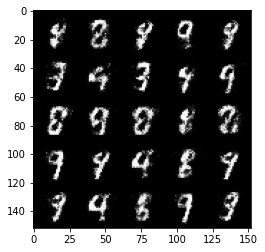

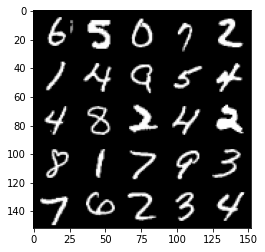

 24%|██▍       | 114/469 [00:04<00:12, 27.97it/s]

Step 17000: Generator loss: 3.314824200630188, discriminator loss: 0.13666499244421734


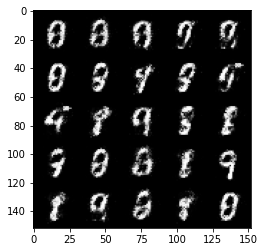

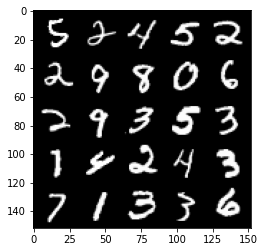

 31%|███▏      | 147/469 [00:05<00:11, 26.90it/s]

Step 17500: Generator loss: 3.474023773670195, discriminator loss: 0.1326438269615175


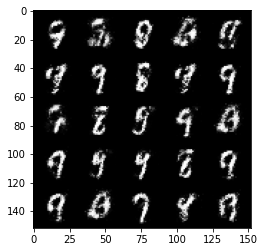

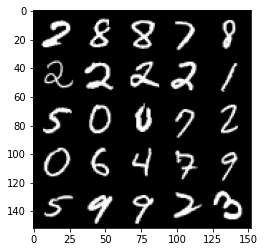

 38%|███▊      | 177/469 [00:06<00:10, 27.92it/s]

Step 18000: Generator loss: 3.1841645832061785, discriminator loss: 0.16368917110562323


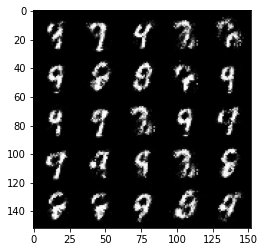

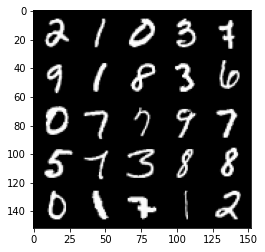

 44%|████▍     | 207/469 [00:07<00:10, 25.38it/s]

Step 18500: Generator loss: 3.2567852993011432, discriminator loss: 0.14159545704722373


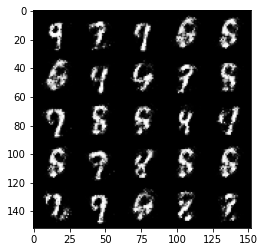

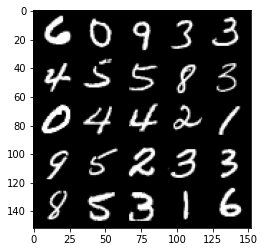

 51%|█████     | 240/469 [00:08<00:08, 27.08it/s]

Step 19000: Generator loss: 3.2081075682640074, discriminator loss: 0.15631365478038786


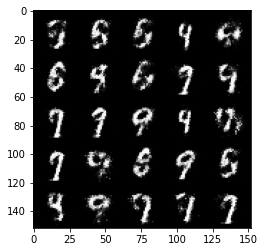

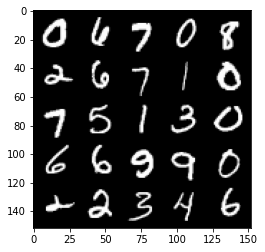

 58%|█████▊    | 270/469 [00:10<00:08, 24.87it/s]

Step 19500: Generator loss: 3.119253225803375, discriminator loss: 0.1729107032120229


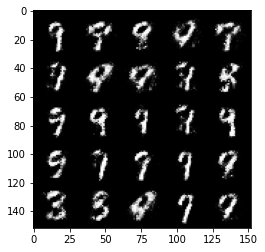

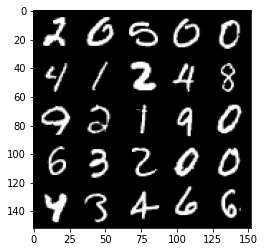

 64%|██████▍   | 300/469 [00:10<00:06, 27.45it/s]

Step 20000: Generator loss: 3.1501671190261846, discriminator loss: 0.15420105007290844


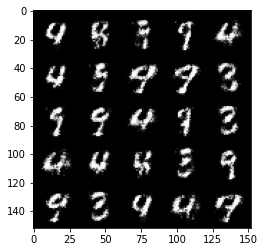

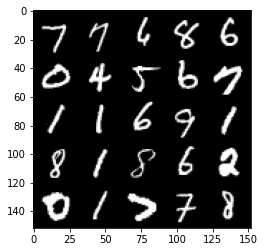

 71%|███████   | 332/469 [00:12<00:04, 28.02it/s]

Step 20500: Generator loss: 3.094418985843657, discriminator loss: 0.1861211485564707


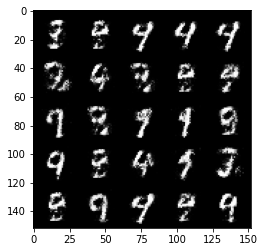

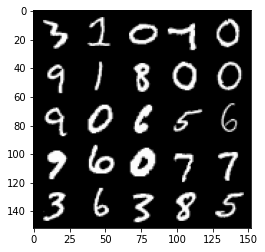

 77%|███████▋  | 362/469 [00:13<00:04, 25.46it/s]

Step 21000: Generator loss: 2.926576758384704, discriminator loss: 0.1942899404019119


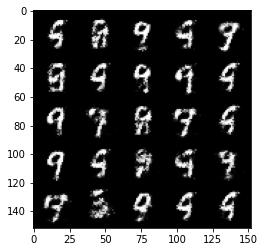

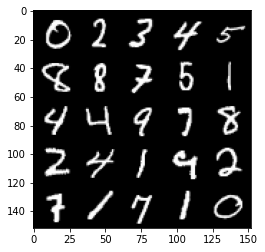

 84%|████████▍ | 395/469 [00:14<00:02, 27.30it/s]

Step 21500: Generator loss: 2.91042285299301, discriminator loss: 0.18766657842695722


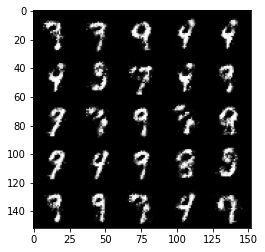

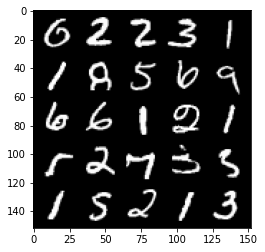

 90%|█████████ | 424/469 [00:15<00:01, 27.54it/s]

Step 22000: Generator loss: 3.0675207495689403, discriminator loss: 0.1720222873091699


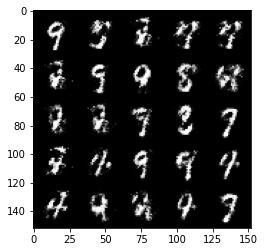

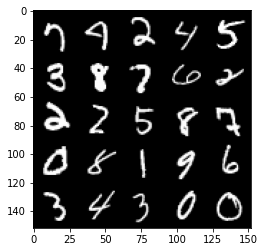

 97%|█████████▋| 455/469 [00:17<00:00, 26.71it/s]

Step 22500: Generator loss: 3.169894491195679, discriminator loss: 0.15754034301638617


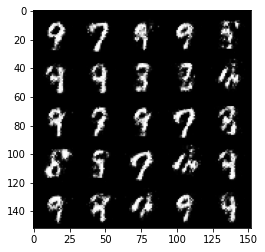

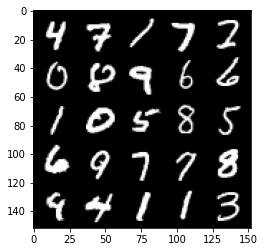

  4%|▍         | 18/469 [00:00<00:16, 26.92it/s]

Step 23000: Generator loss: 3.055320590972899, discriminator loss: 0.1834111146330835


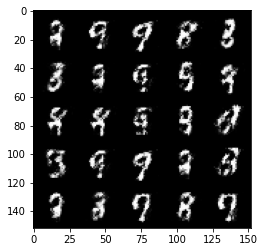

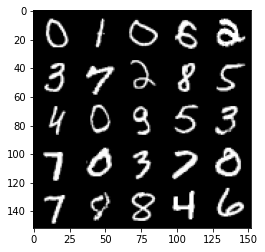

 10%|█         | 48/469 [00:01<00:15, 27.07it/s]

Step 23500: Generator loss: 2.8970872979164093, discriminator loss: 0.1828352644890546


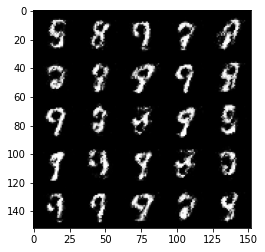

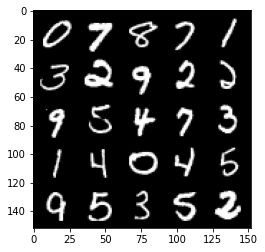

 17%|█▋        | 81/469 [00:02<00:13, 27.93it/s]

Step 24000: Generator loss: 3.019273970603944, discriminator loss: 0.16716412730514996


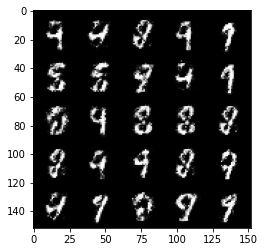

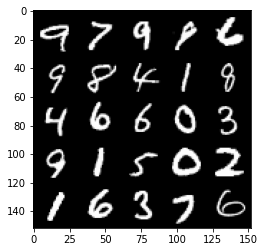

 24%|██▍       | 112/469 [00:04<00:13, 26.14it/s]

Step 24500: Generator loss: 3.0292085165977487, discriminator loss: 0.182987265944481


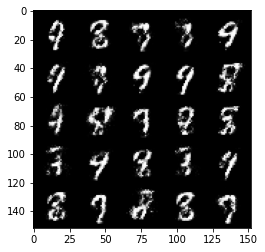

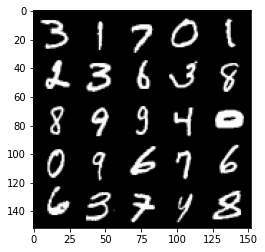

 30%|███       | 141/469 [00:05<00:11, 27.76it/s]

Step 25000: Generator loss: 2.982968640804291, discriminator loss: 0.17561949041485775


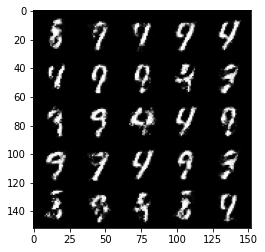

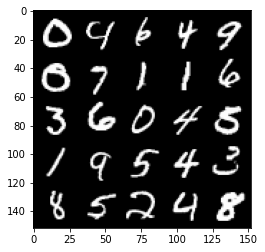

 37%|███▋      | 174/469 [00:06<00:10, 27.17it/s]

Step 25500: Generator loss: 2.761917188167573, discriminator loss: 0.20859398341178903


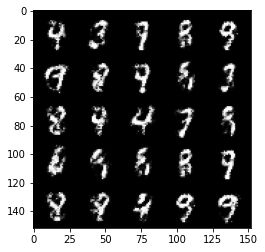

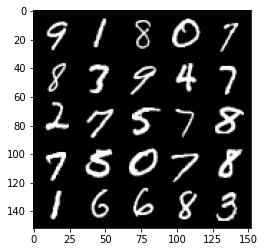

 44%|████▎     | 205/469 [00:07<00:09, 28.51it/s]

Step 26000: Generator loss: 2.7918605599403374, discriminator loss: 0.2067989608049394


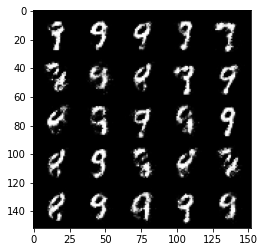

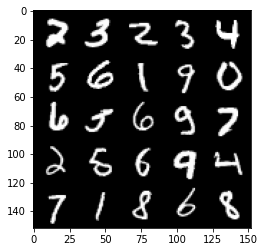

 50%|█████     | 236/469 [00:08<00:08, 27.78it/s]

Step 26500: Generator loss: 2.69971555995941, discriminator loss: 0.20969590367376803


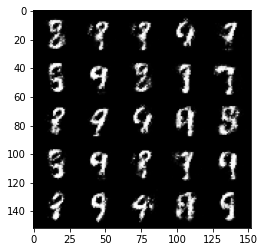

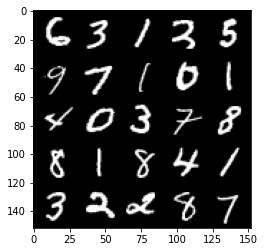

 57%|█████▋    | 265/469 [00:09<00:07, 27.55it/s]

Step 27000: Generator loss: 2.7491427855491644, discriminator loss: 0.19729572239518173


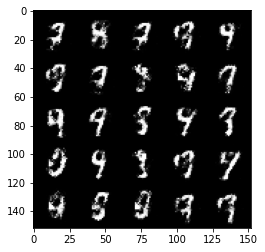

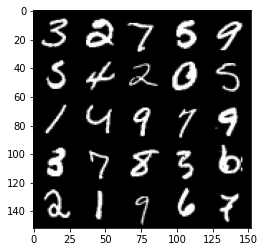

 64%|██████▎   | 298/469 [00:11<00:06, 28.20it/s]

Step 27500: Generator loss: 2.6527657117843617, discriminator loss: 0.23033493974804886


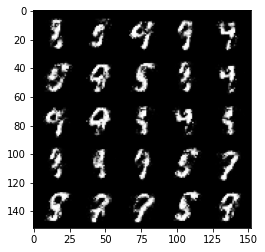

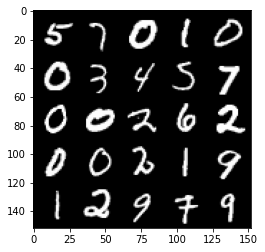

 70%|██████▉   | 327/469 [00:12<00:05, 26.21it/s]

Step 28000: Generator loss: 2.7448461461067195, discriminator loss: 0.20360346505045884


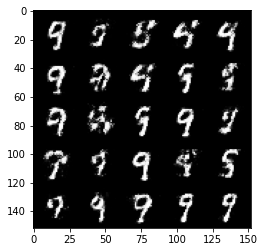

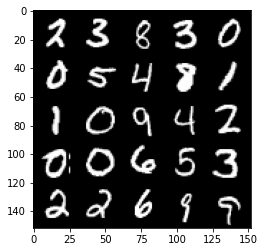

 77%|███████▋  | 360/469 [00:13<00:03, 27.86it/s]

Step 28500: Generator loss: 2.639165591478349, discriminator loss: 0.23498183658719043


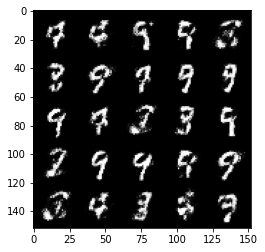

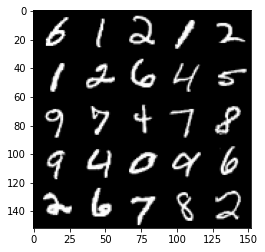

 83%|████████▎ | 391/469 [00:14<00:02, 27.74it/s]

Step 29000: Generator loss: 2.6909717965126014, discriminator loss: 0.2216981685906647


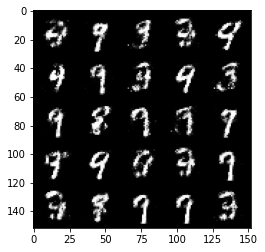

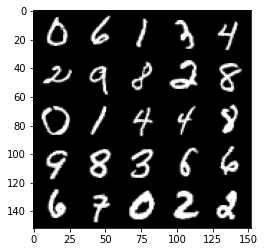

 90%|████████▉ | 420/469 [00:15<00:01, 27.64it/s]

Step 29500: Generator loss: 2.6219466433525054, discriminator loss: 0.2325958802998063


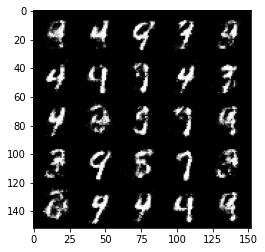

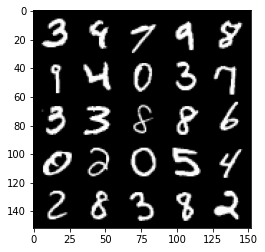

 96%|█████████▋| 452/469 [00:16<00:00, 26.81it/s]

Step 30000: Generator loss: 2.559195880651474, discriminator loss: 0.2352451748251913


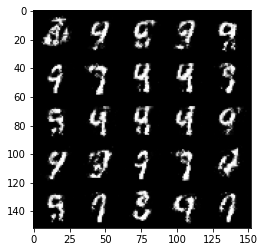

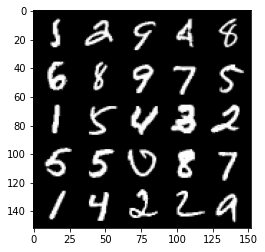

  3%|▎         | 15/469 [00:00<00:16, 27.73it/s]

Step 30500: Generator loss: 2.599733869552613, discriminator loss: 0.21015867662429813


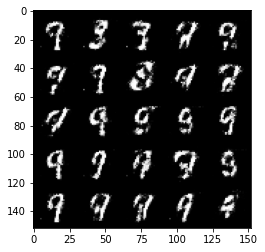

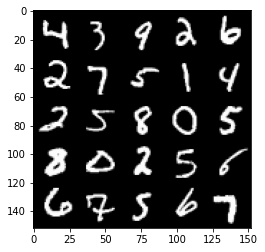

 10%|▉         | 45/469 [00:01<00:15, 26.97it/s]

Step 31000: Generator loss: 2.507480519533157, discriminator loss: 0.249549889445305


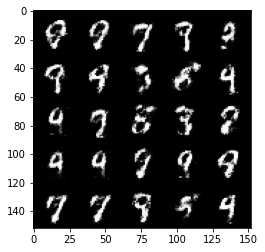

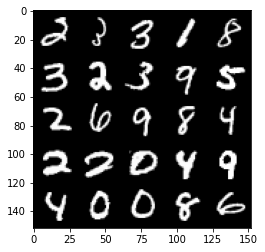

 16%|█▌        | 75/469 [00:02<00:14, 28.09it/s]

Step 31500: Generator loss: 2.5963519005775453, discriminator loss: 0.23175566279888174


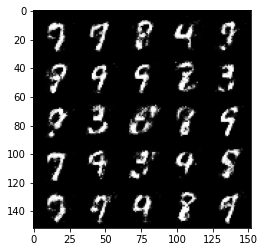

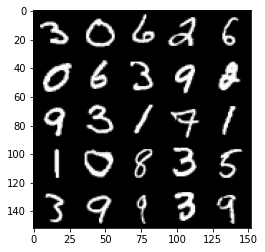

 23%|██▎       | 108/469 [00:03<00:13, 26.25it/s]

Step 32000: Generator loss: 2.3433007733821847, discriminator loss: 0.26844732657074916


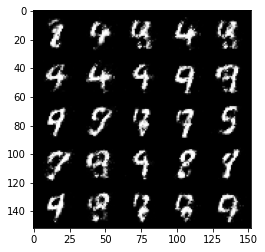

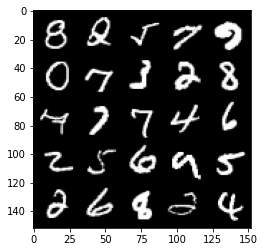

 30%|██▉       | 139/469 [00:05<00:12, 27.30it/s]

Step 32500: Generator loss: 2.3908847751617417, discriminator loss: 0.24250101673603044


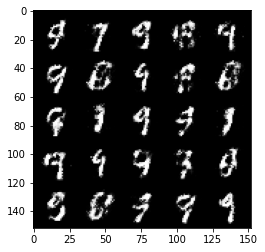

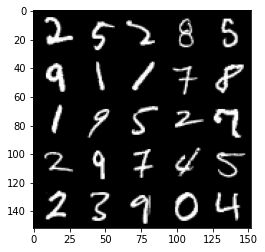

 36%|███▌      | 169/469 [00:06<00:12, 24.82it/s]

Step 33000: Generator loss: 2.4689490079879746, discriminator loss: 0.24061819282174113


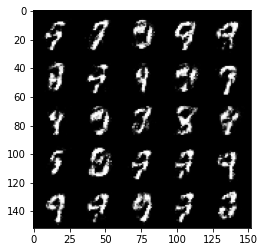

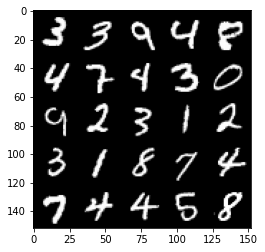

 43%|████▎     | 201/469 [00:07<00:11, 23.17it/s]

Step 33500: Generator loss: 2.522759829044344, discriminator loss: 0.22837671822309474


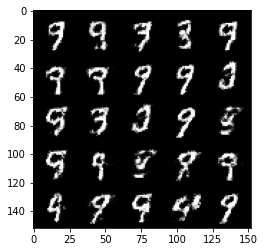

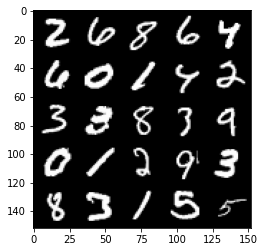

 49%|████▉     | 232/469 [00:08<00:08, 27.81it/s]

Step 34000: Generator loss: 2.571160534381868, discriminator loss: 0.22220552125573156


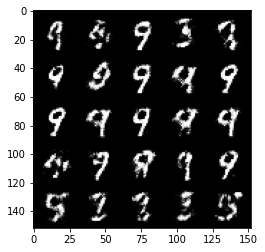

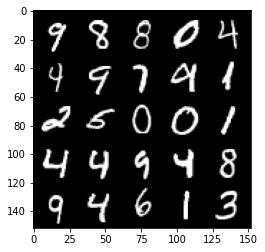

 56%|█████▌    | 263/469 [00:09<00:07, 27.60it/s]

Step 34500: Generator loss: 2.4536599647998814, discriminator loss: 0.25355606356263155


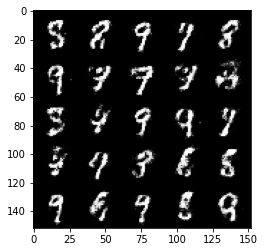

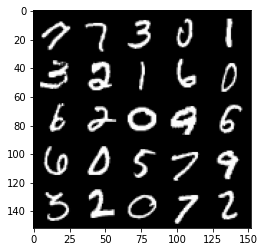

 62%|██████▏   | 292/469 [00:10<00:06, 28.33it/s]

Step 35000: Generator loss: 2.3049206531047823, discriminator loss: 0.2743364557623867


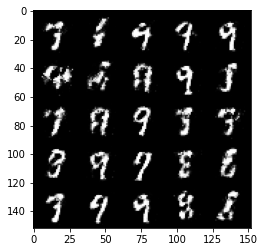

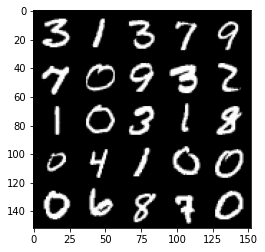

 69%|██████▉   | 324/469 [00:12<00:05, 24.86it/s]

Step 35500: Generator loss: 2.339569388389589, discriminator loss: 0.2506415477395056


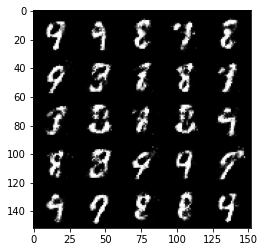

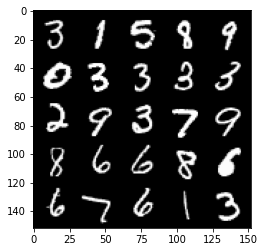

 76%|███████▌  | 356/469 [00:13<00:03, 28.27it/s]

Step 36000: Generator loss: 2.31351001024246, discriminator loss: 0.272410741508007


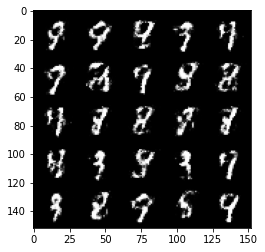

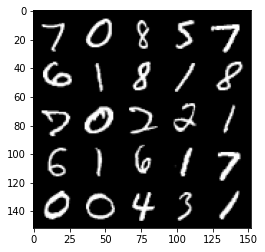

 82%|████████▏ | 385/469 [00:14<00:03, 25.78it/s]

Step 36500: Generator loss: 2.282983140945435, discriminator loss: 0.26878092211484933


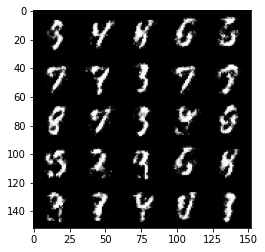

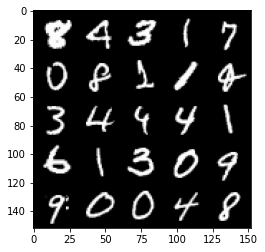

 89%|████████▊ | 416/469 [00:15<00:01, 26.94it/s]

Step 37000: Generator loss: 2.4223165998458853, discriminator loss: 0.2507397237718107


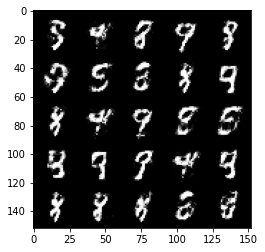

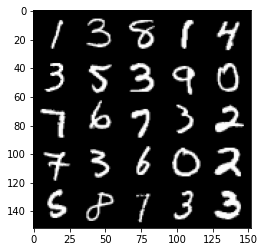

 96%|█████████▌| 448/469 [00:16<00:00, 27.11it/s]

Step 37500: Generator loss: 2.4678756926059733, discriminator loss: 0.2323847792446612


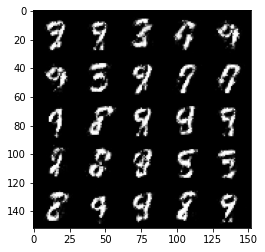

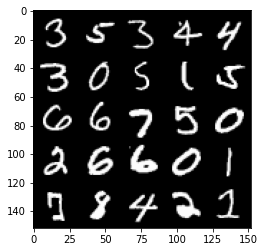

  2%|▏         | 9/469 [00:00<00:16, 27.23it/s]

Step 38000: Generator loss: 2.348532349348066, discriminator loss: 0.2565041300356387


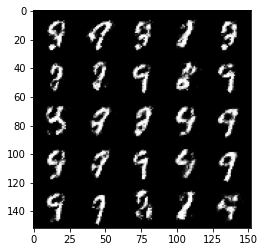

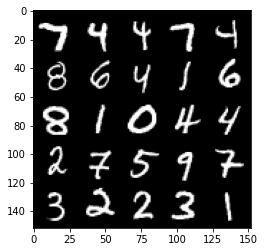

  8%|▊         | 39/469 [00:01<00:15, 27.30it/s]

Step 38500: Generator loss: 2.308414954662324, discriminator loss: 0.28005495142936726


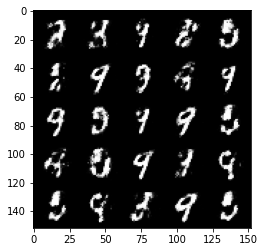

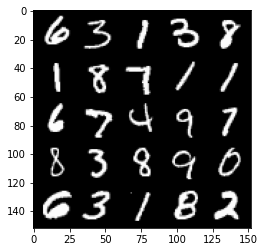

 15%|█▌        | 72/469 [00:02<00:14, 27.36it/s]

Step 39000: Generator loss: 2.383149948596956, discriminator loss: 0.2546343081593512


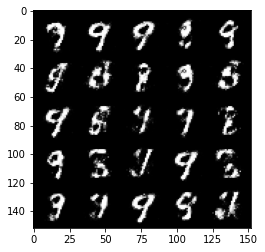

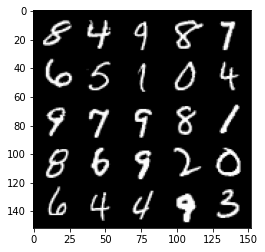

 22%|██▏       | 102/469 [00:03<00:14, 26.19it/s]

Step 39500: Generator loss: 2.3635422134399393, discriminator loss: 0.2583196033835412


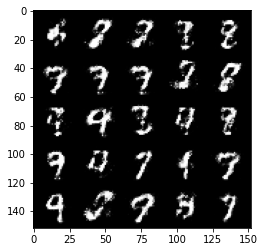

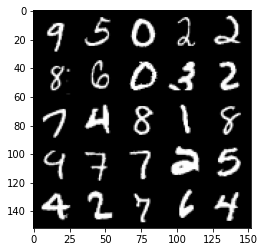

 29%|██▉       | 135/469 [00:04<00:11, 28.06it/s]

Step 40000: Generator loss: 2.230694836854934, discriminator loss: 0.276918003410101


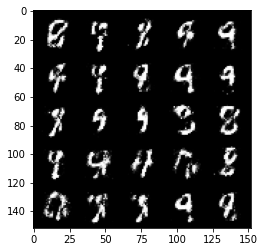

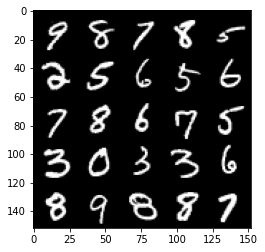

 35%|███▌      | 165/469 [00:06<00:12, 24.16it/s]

Step 40500: Generator loss: 2.3833920617103614, discriminator loss: 0.25693095165491103


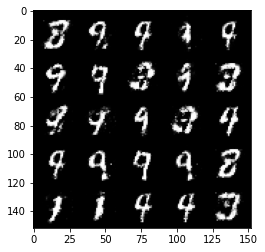

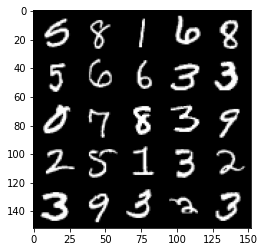

 42%|████▏     | 195/469 [00:07<00:10, 25.02it/s]

Step 41000: Generator loss: 2.2427689948081966, discriminator loss: 0.29335540977120406


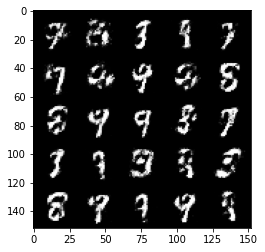

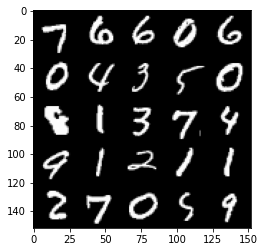

 49%|████▊     | 228/469 [00:08<00:08, 27.68it/s]

Step 41500: Generator loss: 2.1994076814651495, discriminator loss: 0.2861120961010457


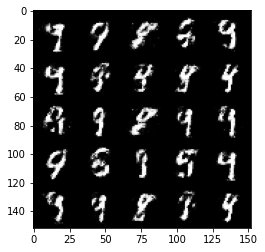

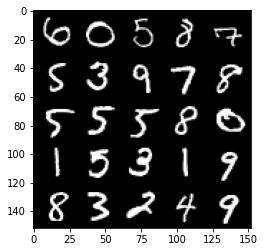

 55%|█████▍    | 257/469 [00:09<00:07, 28.57it/s]

Step 42000: Generator loss: 2.177628398656845, discriminator loss: 0.2975579942464827


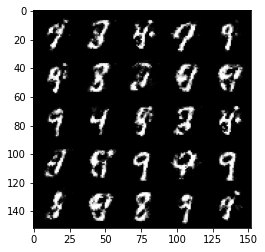

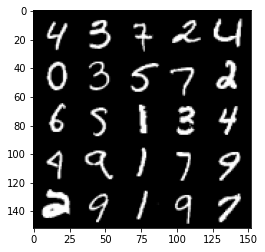

 62%|██████▏   | 289/469 [00:10<00:06, 27.63it/s]

Step 42500: Generator loss: 2.120938784837726, discriminator loss: 0.31308604788780237


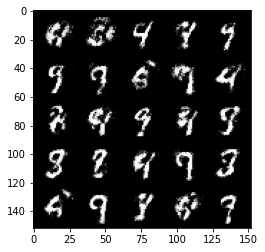

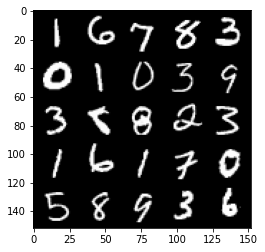

 68%|██████▊   | 320/469 [00:11<00:05, 28.10it/s]

Step 43000: Generator loss: 2.1692535426616666, discriminator loss: 0.29441799107193933


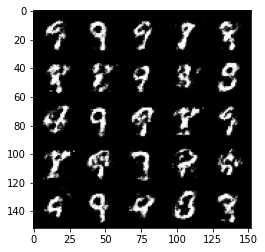

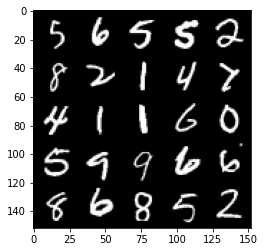

 75%|███████▍  | 351/469 [00:12<00:04, 27.40it/s]

Step 43500: Generator loss: 2.132482874870301, discriminator loss: 0.2893592142462731


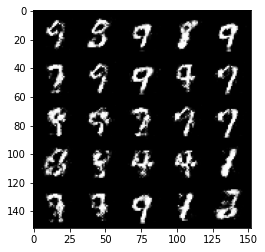

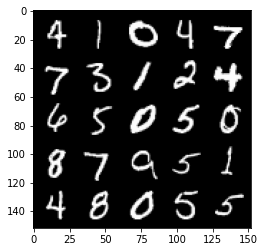

 82%|████████▏ | 383/469 [00:13<00:03, 27.79it/s]

Step 44000: Generator loss: 2.0316144990921012, discriminator loss: 0.31612390780448896


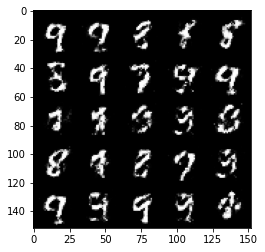

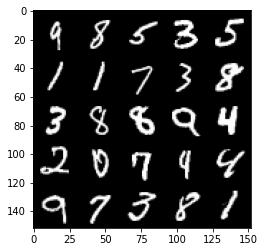

 88%|████████▊ | 412/469 [00:15<00:02, 27.26it/s]

Step 44500: Generator loss: 2.090301084995271, discriminator loss: 0.3036805960536004


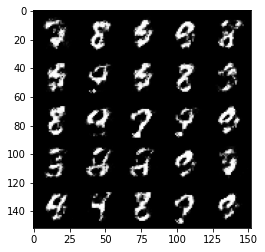

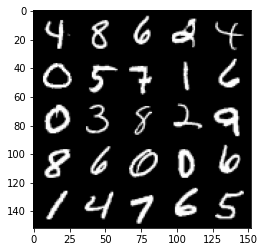

 95%|█████████▍| 445/469 [00:16<00:00, 25.88it/s]

Step 45000: Generator loss: 2.082606817483901, discriminator loss: 0.29247135517001144


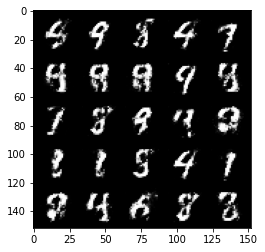

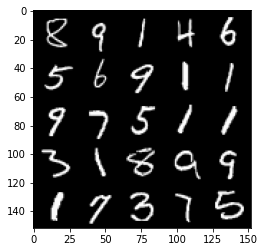

  1%|▏         | 6/469 [00:00<00:16, 27.47it/s]

Step 45500: Generator loss: 2.2053800563812267, discriminator loss: 0.2599995083510876


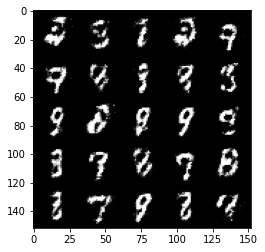

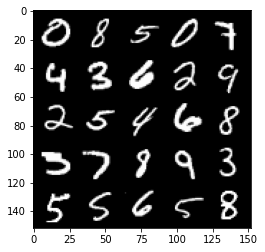

  8%|▊         | 36/469 [00:01<00:15, 28.19it/s]

Step 46000: Generator loss: 2.1725600903034206, discriminator loss: 0.276819560945034


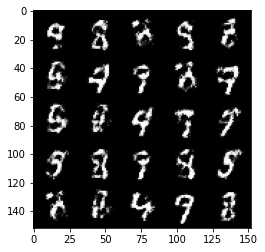

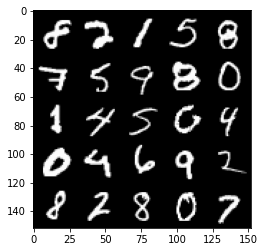

 15%|█▍        | 69/469 [00:02<00:14, 27.78it/s]

Step 46500: Generator loss: 2.153264221668246, discriminator loss: 0.29022797730565053


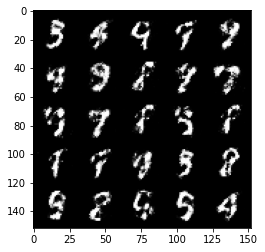

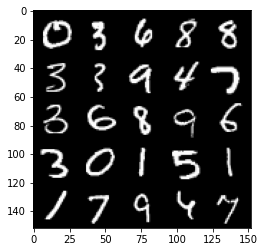

 21%|██▏       | 100/469 [00:03<00:14, 24.87it/s]

Step 47000: Generator loss: 2.0010394933223723, discriminator loss: 0.3180643399655818


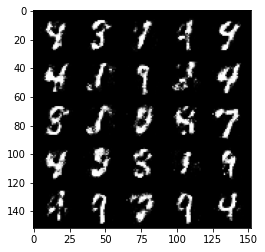

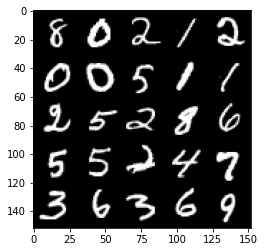

 28%|██▊       | 130/469 [00:04<00:12, 28.13it/s]

Step 47500: Generator loss: 2.1488979549407974, discriminator loss: 0.2907372140884396


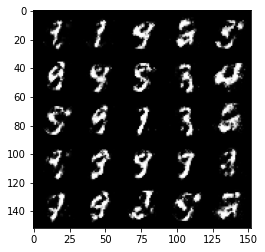

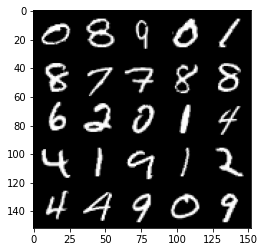

 35%|███▍      | 162/469 [00:06<00:12, 24.31it/s]

Step 48000: Generator loss: 2.0887002696990957, discriminator loss: 0.30173842203617124


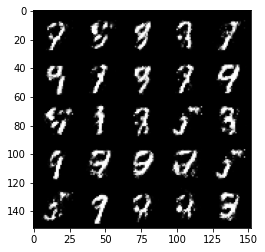

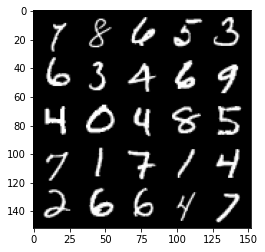

 41%|████      | 192/469 [00:07<00:09, 27.74it/s]

Step 48500: Generator loss: 2.117534522294998, discriminator loss: 0.295331922113895


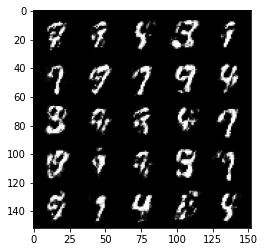

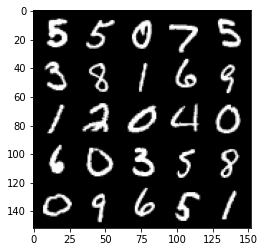

 48%|████▊     | 223/469 [00:08<00:09, 25.39it/s]

Step 49000: Generator loss: 2.05963192176819, discriminator loss: 0.3077882679998875


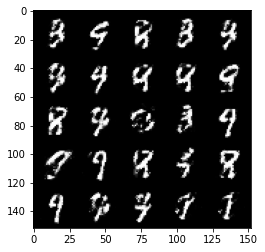

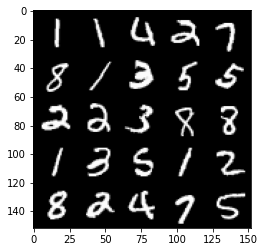

 54%|█████▍    | 253/469 [00:09<00:07, 27.96it/s]

Step 49500: Generator loss: 2.0555379798412314, discriminator loss: 0.3062455321848396


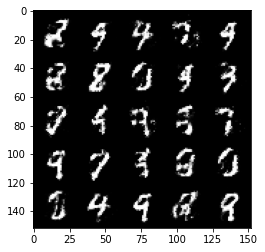

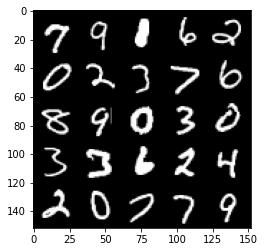

 61%|██████    | 285/469 [00:10<00:06, 27.89it/s]

Step 50000: Generator loss: 2.0583055593967443, discriminator loss: 0.30493070939183226


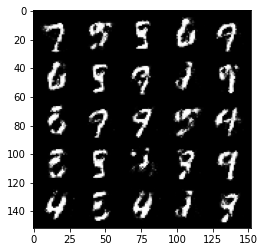

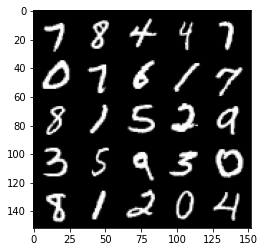

 67%|██████▋   | 315/469 [00:11<00:05, 27.73it/s]

Step 50500: Generator loss: 1.9628912787437454, discriminator loss: 0.3257658677101135


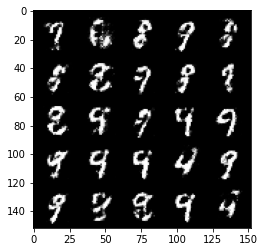

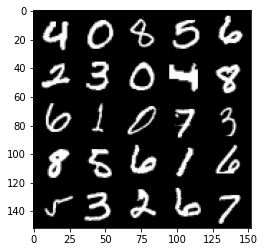

 74%|███████▍  | 346/469 [00:12<00:05, 22.36it/s]

Step 51000: Generator loss: 1.9237455642223353, discriminator loss: 0.3435732522606853


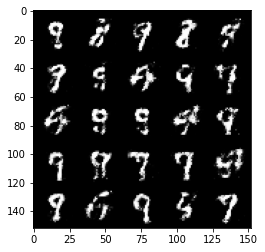

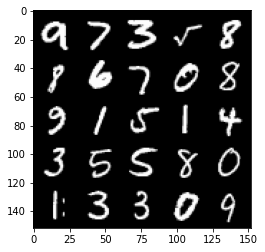

 81%|████████  | 378/469 [00:13<00:03, 26.77it/s]

Step 51500: Generator loss: 1.9379433288574228, discriminator loss: 0.3344007250368594


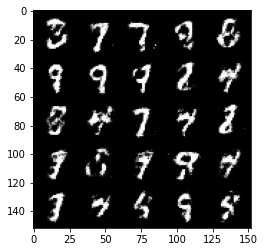

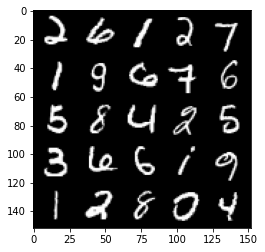

 87%|████████▋ | 409/469 [00:15<00:02, 27.62it/s]

Step 52000: Generator loss: 1.9550504019260408, discriminator loss: 0.33277501550316835


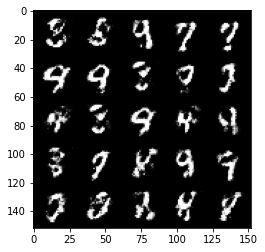

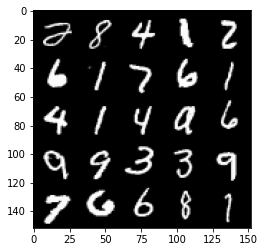

 94%|█████████▍| 441/469 [00:16<00:01, 27.66it/s]

Step 52500: Generator loss: 1.8980709259510067, discriminator loss: 0.34346102613210683


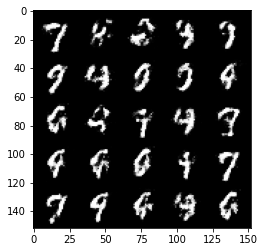

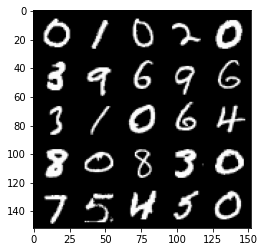

  1%|          | 3/469 [00:00<00:19, 23.55it/s]

Step 53000: Generator loss: 1.8473842477798452, discriminator loss: 0.35913143193721786


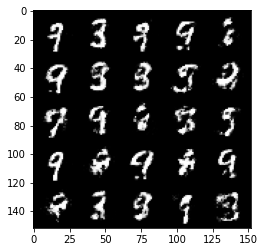

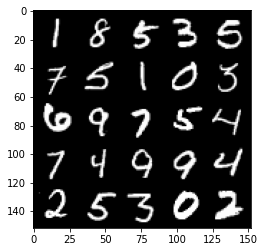

  7%|▋         | 32/469 [00:01<00:15, 28.48it/s]

Step 53500: Generator loss: 1.8370439813137065, discriminator loss: 0.362575567066669


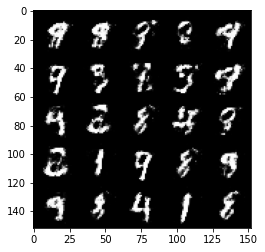

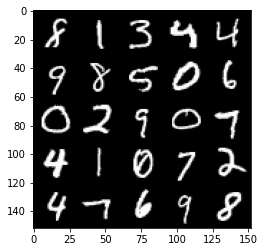

 13%|█▎        | 63/469 [00:02<00:14, 27.96it/s]

Step 54000: Generator loss: 1.8134193525314335, discriminator loss: 0.36363868159055734


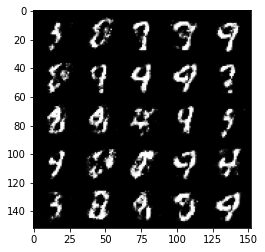

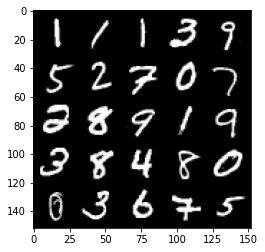

 20%|██        | 96/469 [00:03<00:13, 27.44it/s]

Step 54500: Generator loss: 1.9121218323707572, discriminator loss: 0.3389813790023331


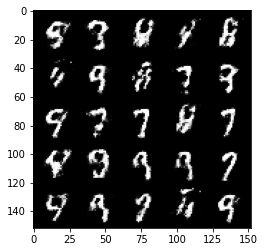

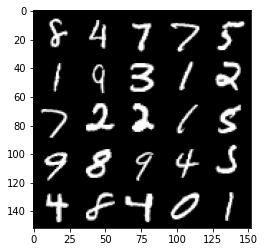

 27%|██▋       | 126/469 [00:04<00:12, 27.69it/s]

Step 55000: Generator loss: 1.868327665567397, discriminator loss: 0.33920554891228677


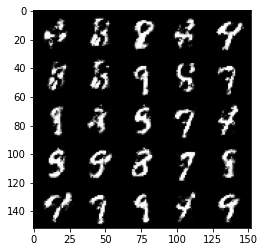

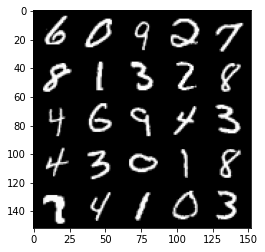

 33%|███▎      | 156/469 [00:06<00:11, 26.62it/s]

Step 55500: Generator loss: 1.8707807102203373, discriminator loss: 0.3316987501680851


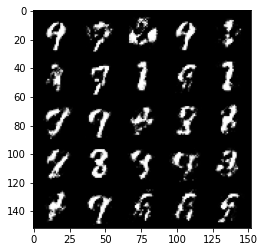

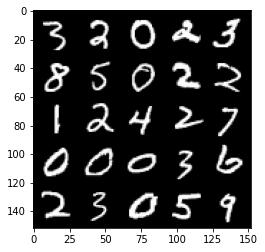

 40%|████      | 189/469 [00:07<00:11, 25.05it/s]

Step 56000: Generator loss: 1.8694121134281152, discriminator loss: 0.346646332800388


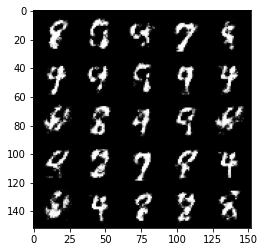

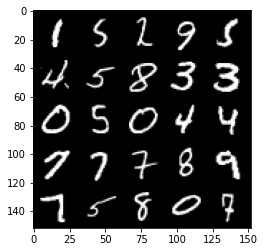

 46%|████▋     | 218/469 [00:09<00:10, 24.18it/s]

Step 56500: Generator loss: 1.884970435142514, discriminator loss: 0.3474186714291573


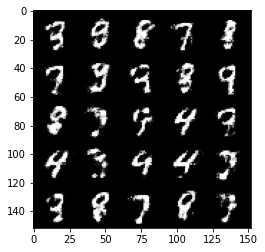

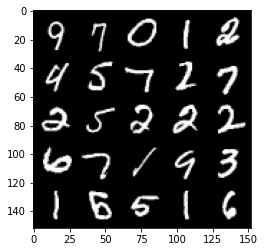

 53%|█████▎    | 249/469 [00:10<00:09, 24.15it/s]

Step 57000: Generator loss: 1.8786916909217817, discriminator loss: 0.335750203222036


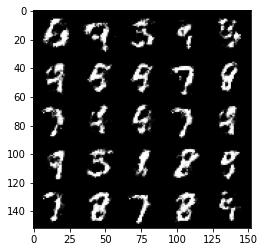

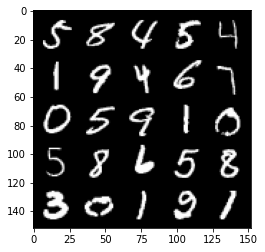

 60%|██████    | 282/469 [00:11<00:07, 25.35it/s]

Step 57500: Generator loss: 1.8990645754337305, discriminator loss: 0.3279764088690281


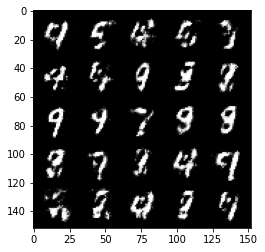

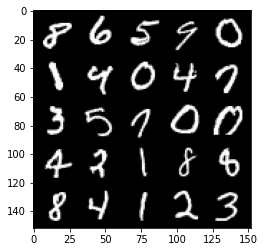

 67%|██████▋   | 312/469 [00:12<00:06, 25.11it/s]

Step 58000: Generator loss: 1.90736904668808, discriminator loss: 0.3275978231430055


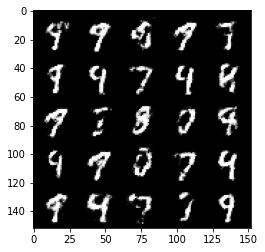

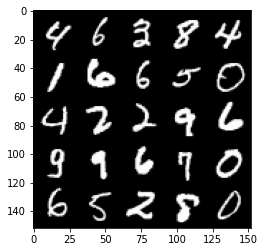

 73%|███████▎  | 342/469 [00:13<00:04, 26.24it/s]

Step 58500: Generator loss: 1.8522992525100692, discriminator loss: 0.33728430330753334


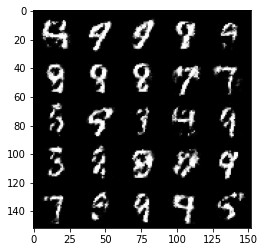

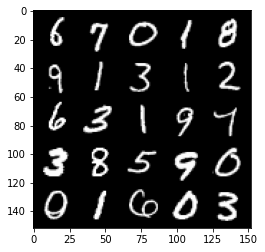

 80%|███████▉  | 375/469 [00:15<00:03, 23.84it/s]

Step 59000: Generator loss: 1.8150742225646974, discriminator loss: 0.33404326063394557


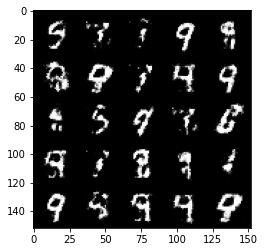

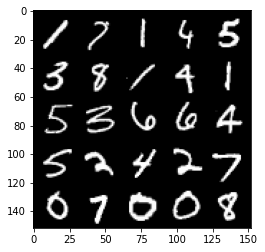

 86%|████████▋ | 405/469 [00:16<00:02, 22.82it/s]

Step 59500: Generator loss: 1.8828217036724075, discriminator loss: 0.3200535023212436


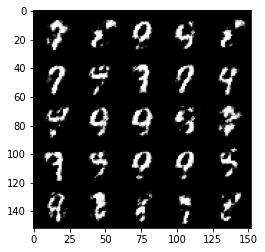

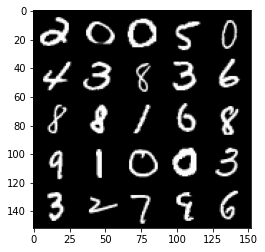

 93%|█████████▎| 435/469 [00:17<00:01, 24.28it/s]

Step 60000: Generator loss: 2.007898474931717, discriminator loss: 0.3062184032201768


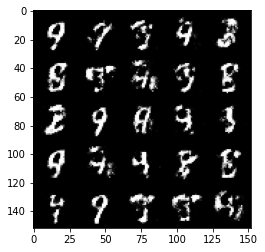

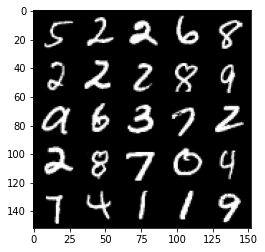

100%|█████████▉| 468/469 [00:19<00:00, 25.72it/s]

Step 60500: Generator loss: 1.904610510110855, discriminator loss: 0.32835042023658767


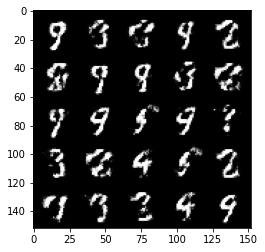

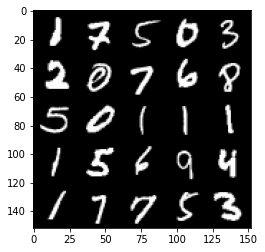

  6%|▋         | 30/469 [00:01<00:18, 23.71it/s]

Step 61000: Generator loss: 1.811591524362564, discriminator loss: 0.35736127156019226


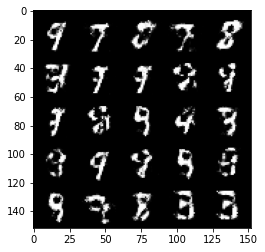

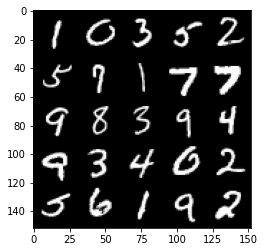

 13%|█▎        | 60/469 [00:02<00:15, 25.58it/s]

Step 61500: Generator loss: 1.7877569243907938, discriminator loss: 0.3497845955491068


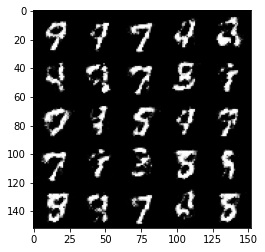

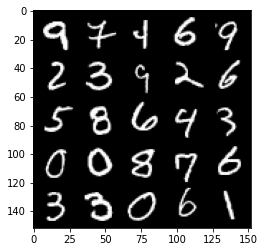

 19%|█▉        | 90/469 [00:03<00:14, 26.64it/s]

Step 62000: Generator loss: 1.8818856818675993, discriminator loss: 0.3238010533452037


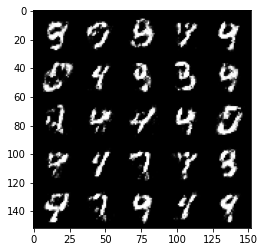

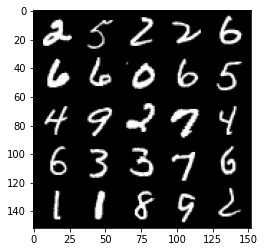

 26%|██▌       | 121/469 [00:04<00:13, 26.57it/s]

Step 62500: Generator loss: 1.7824250953197485, discriminator loss: 0.36276725026965123


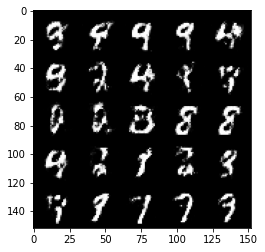

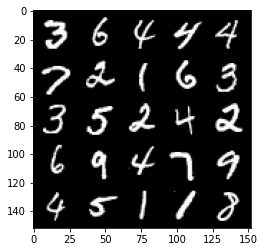

 33%|███▎      | 153/469 [00:06<00:12, 25.13it/s]

Step 63000: Generator loss: 1.854930044412611, discriminator loss: 0.3393619715571404


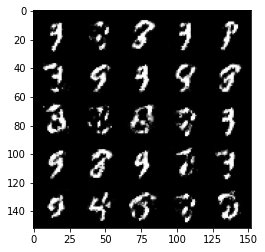

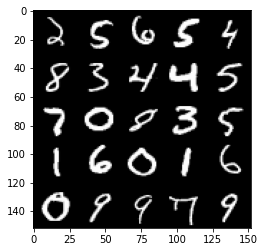

 39%|███▉      | 183/469 [00:07<00:12, 22.57it/s]

Step 63500: Generator loss: 1.883324114799499, discriminator loss: 0.3249123396873475


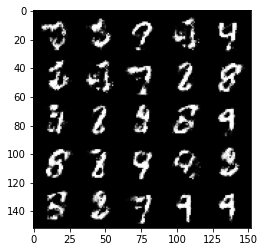

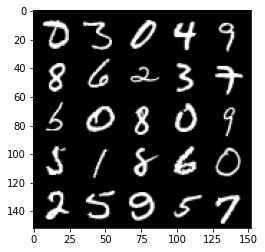

 46%|████▌     | 216/469 [00:08<00:11, 22.96it/s]

Step 64000: Generator loss: 1.8997611176967633, discriminator loss: 0.32735427844524356


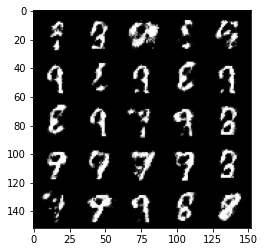

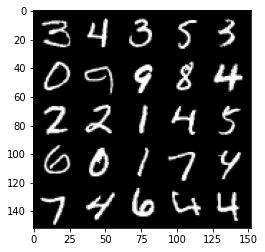

 52%|█████▏    | 246/469 [00:10<00:09, 24.00it/s]

Step 64500: Generator loss: 1.7781154460906994, discriminator loss: 0.36179148429632174


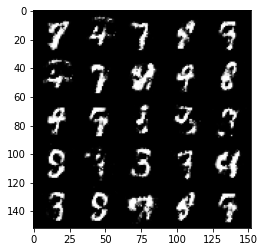

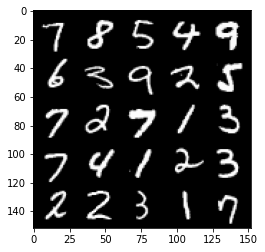

 59%|█████▉    | 278/469 [00:11<00:07, 26.68it/s]

Step 65000: Generator loss: 1.7220345211029058, discriminator loss: 0.3651249008178706


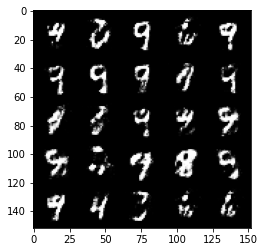

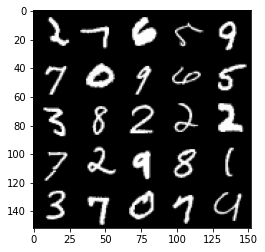

 66%|██████▌   | 309/469 [00:12<00:06, 25.14it/s]

Step 65500: Generator loss: 1.7390985867977131, discriminator loss: 0.3481199161708351


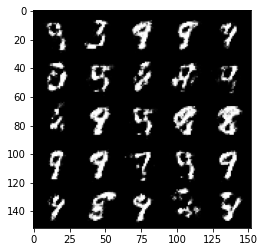

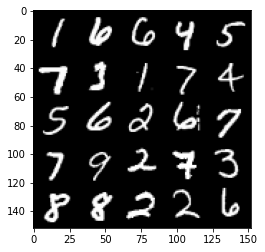

 72%|███████▏  | 339/469 [00:13<00:04, 26.14it/s]

Step 66000: Generator loss: 1.7463928096294428, discriminator loss: 0.3624879550933836


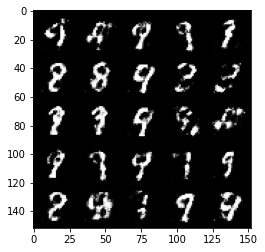

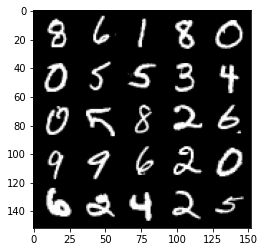

 79%|███████▉  | 370/469 [00:14<00:03, 26.48it/s]

Step 66500: Generator loss: 1.692010055065156, discriminator loss: 0.373993053644896


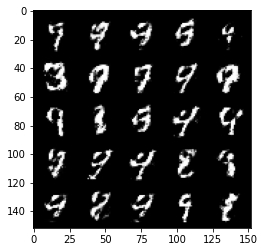

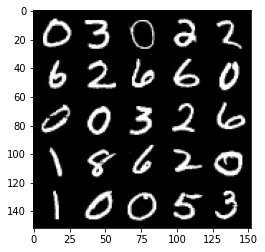

 86%|████████▌ | 401/469 [00:16<00:03, 21.14it/s]

Step 67000: Generator loss: 1.7874104707241059, discriminator loss: 0.3534004638195035


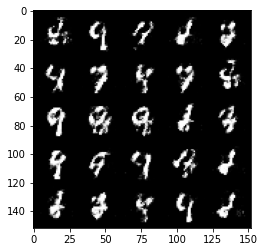

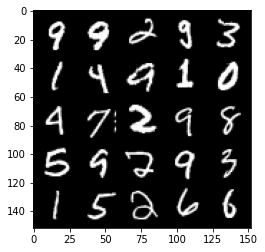

 92%|█████████▏| 433/469 [00:17<00:01, 24.08it/s]

Step 67500: Generator loss: 1.7485308935642239, discriminator loss: 0.3592137456536294


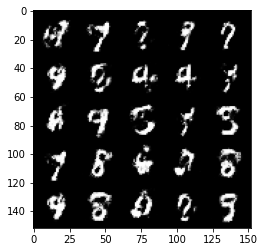

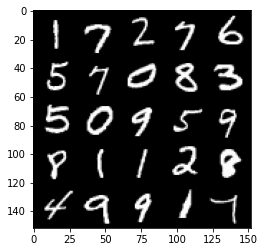

 99%|█████████▊| 463/469 [00:18<00:00, 26.68it/s]

Step 68000: Generator loss: 1.710657434225082, discriminator loss: 0.3864184333086018


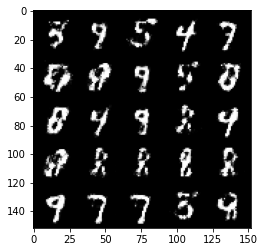

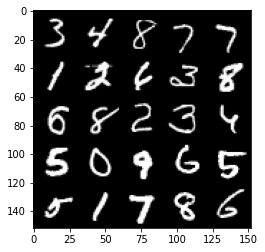

  5%|▌         | 24/469 [00:00<00:16, 27.41it/s]

Step 68500: Generator loss: 1.7490363061428058, discriminator loss: 0.36116683048009857


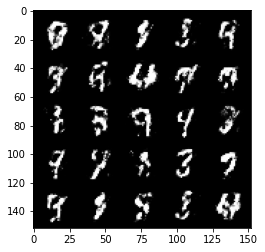

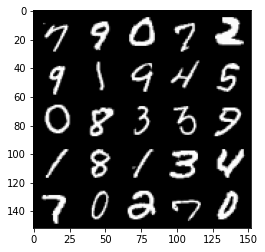

 12%|█▏        | 57/469 [00:02<00:16, 24.67it/s]

Step 69000: Generator loss: 1.764903547763825, discriminator loss: 0.35575662368535976


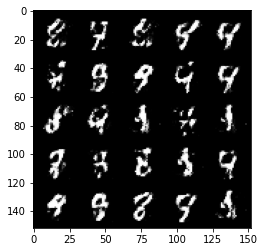

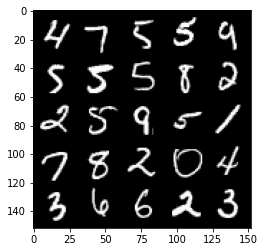

 19%|█▊        | 87/469 [00:03<00:14, 27.24it/s]

Step 69500: Generator loss: 1.7103800795078277, discriminator loss: 0.3747511667013167


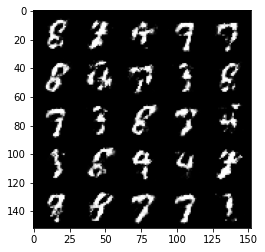

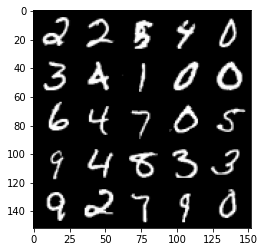

 25%|██▍       | 117/469 [00:04<00:14, 23.72it/s]

Step 70000: Generator loss: 1.6928025236129747, discriminator loss: 0.3697160827517511


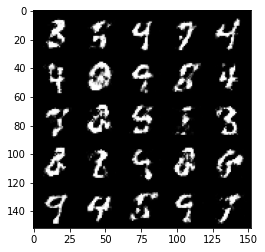

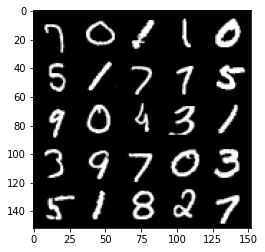

 32%|███▏      | 150/469 [00:06<00:13, 23.18it/s]

Step 70500: Generator loss: 1.6820899946689603, discriminator loss: 0.36498250788450226


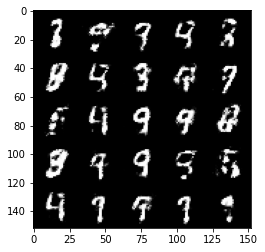

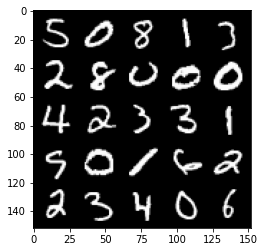

 38%|███▊      | 180/469 [00:07<00:13, 21.98it/s]

Step 71000: Generator loss: 1.676991606950759, discriminator loss: 0.36168609070777896


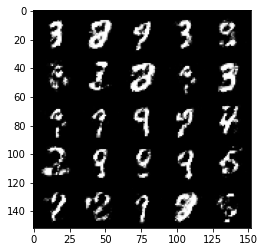

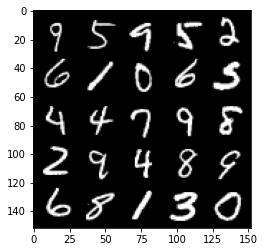

 45%|████▍     | 210/469 [00:08<00:11, 22.96it/s]

Step 71500: Generator loss: 1.635505213975906, discriminator loss: 0.3820615718960765


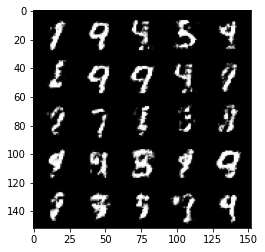

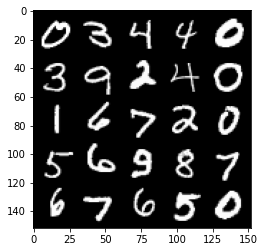

 52%|█████▏    | 242/469 [00:09<00:08, 25.57it/s]

Step 72000: Generator loss: 1.6627615199089056, discriminator loss: 0.376605311334133


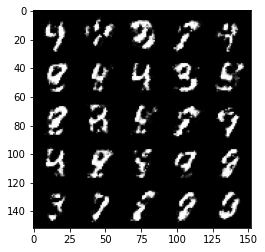

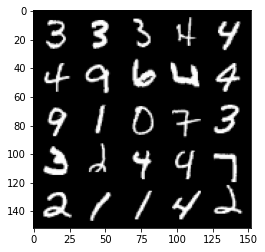

 58%|█████▊    | 273/469 [00:11<00:07, 25.33it/s]

Step 72500: Generator loss: 1.6823222682476053, discriminator loss: 0.38230920213460917


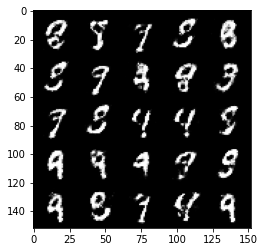

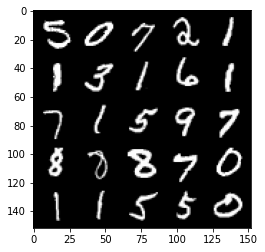

 65%|██████▍   | 303/469 [00:11<00:06, 27.45it/s]

Step 73000: Generator loss: 1.6067527995109576, discriminator loss: 0.4017505301833154


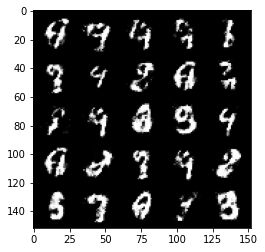

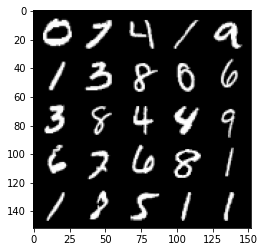

 72%|███████▏  | 336/469 [00:13<00:04, 26.84it/s]

Step 73500: Generator loss: 1.6003232676982868, discriminator loss: 0.3901156824231145


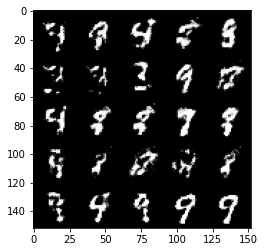

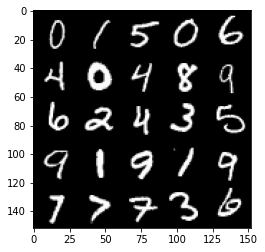

 78%|███████▊  | 367/469 [00:14<00:03, 26.54it/s]

Step 74000: Generator loss: 1.6009677915573108, discriminator loss: 0.38660210311412835


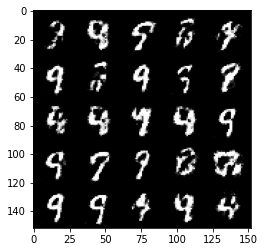

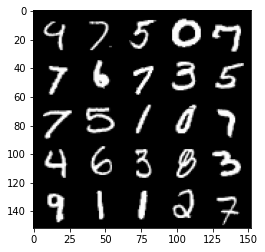

 84%|████████▍ | 396/469 [00:15<00:02, 24.85it/s]

Step 74500: Generator loss: 1.564099333524702, discriminator loss: 0.41438943141698775


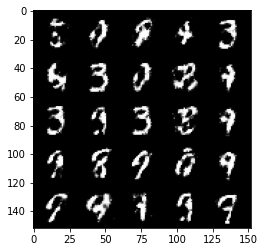

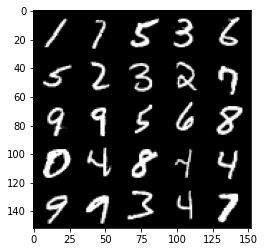

 91%|█████████▏| 428/469 [00:16<00:01, 26.16it/s]

Step 75000: Generator loss: 1.5871799914836868, discriminator loss: 0.39917845976352695


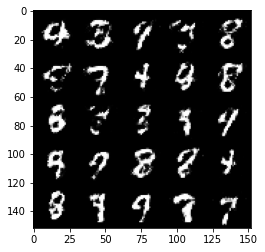

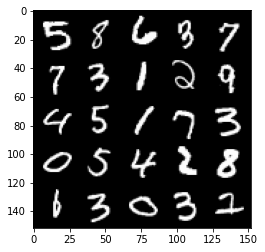

 98%|█████████▊| 459/469 [00:18<00:00, 26.47it/s]

Step 75500: Generator loss: 1.6445904645919789, discriminator loss: 0.3824660679697992


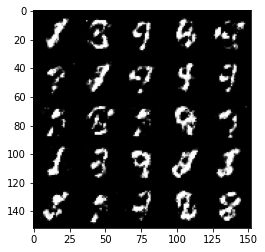

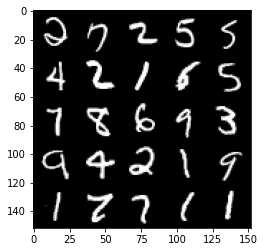

  4%|▍         | 21/469 [00:00<00:18, 24.21it/s]

Step 76000: Generator loss: 1.4978098235130302, discriminator loss: 0.4147914090752601


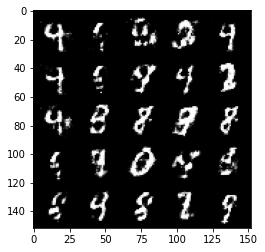

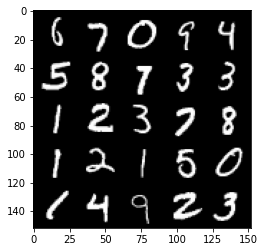

 11%|█         | 51/469 [00:02<00:15, 26.33it/s]

Step 76500: Generator loss: 1.6117322936058038, discriminator loss: 0.3841261752247811


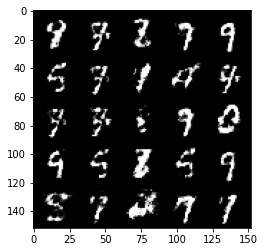

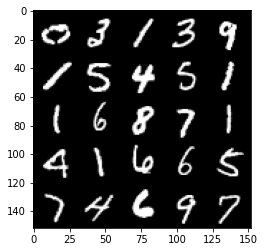

 18%|█▊        | 84/469 [00:03<00:19, 19.62it/s]

Step 77000: Generator loss: 1.5564742283821111, discriminator loss: 0.4038998622894286


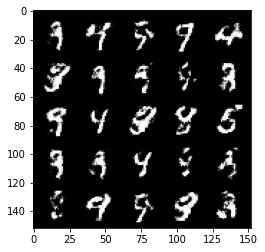

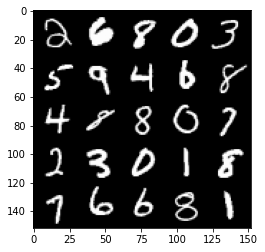

 24%|██▍       | 114/469 [00:04<00:13, 27.20it/s]

Step 77500: Generator loss: 1.534648612022399, discriminator loss: 0.412653325617313


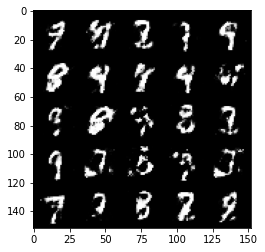

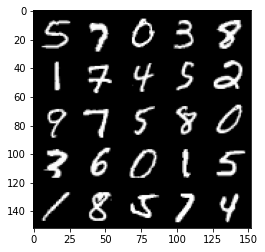

 31%|███       | 144/469 [00:05<00:12, 25.92it/s]

Step 78000: Generator loss: 1.6509324328899386, discriminator loss: 0.38902323377132425


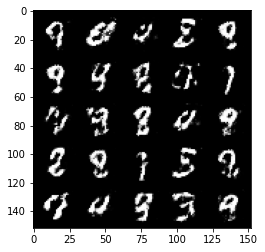

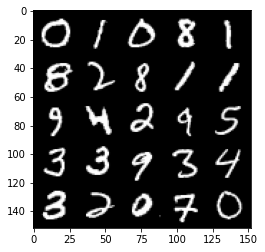

 38%|███▊      | 177/469 [00:07<00:11, 26.09it/s]

Step 78500: Generator loss: 1.6061938083171843, discriminator loss: 0.3936944767236712


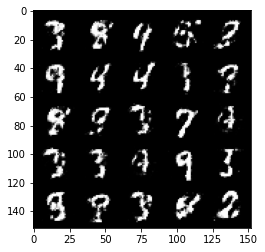

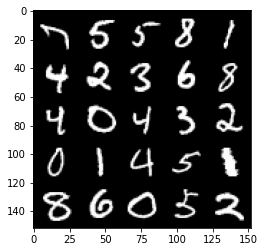

 44%|████▍     | 208/469 [00:08<00:10, 25.86it/s]

Step 79000: Generator loss: 1.5798484797477719, discriminator loss: 0.40012031364440903


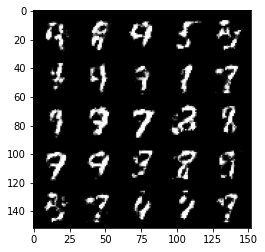

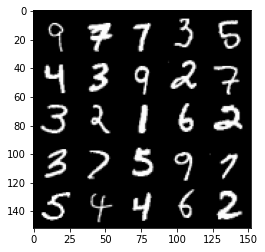

 51%|█████     | 237/469 [00:09<00:08, 25.96it/s]

Step 79500: Generator loss: 1.584514396190642, discriminator loss: 0.3856687865853308


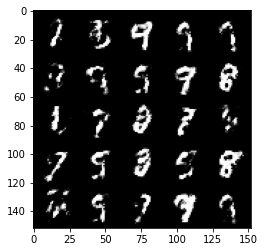

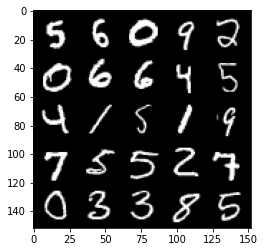

 58%|█████▊    | 270/469 [00:11<00:07, 25.97it/s]

Step 80000: Generator loss: 1.596706819295883, discriminator loss: 0.38126459020376197


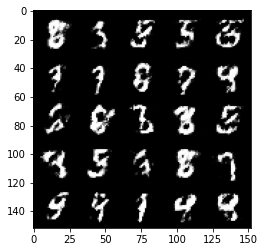

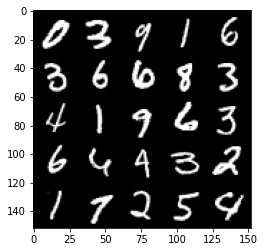

 64%|██████▍   | 300/469 [00:12<00:06, 24.38it/s]

Step 80500: Generator loss: 1.6306756918430318, discriminator loss: 0.3848666263818736


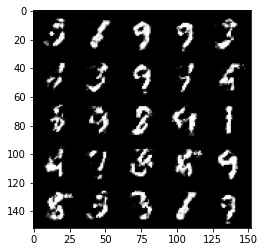

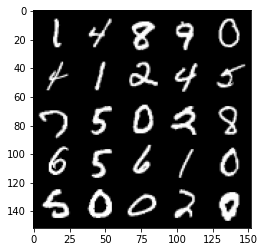

 71%|███████   | 331/469 [00:14<00:05, 24.97it/s]

Step 81000: Generator loss: 1.5750409705638877, discriminator loss: 0.40657536834478364


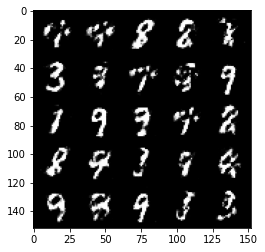

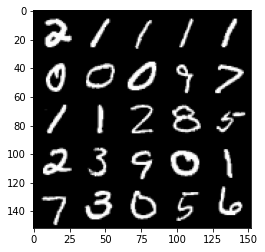

 77%|███████▋  | 361/469 [00:14<00:04, 22.40it/s]

Step 81500: Generator loss: 1.5805694606304137, discriminator loss: 0.4005408033728603


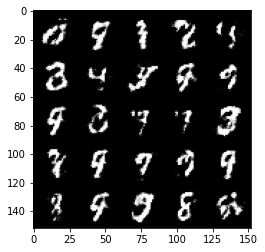

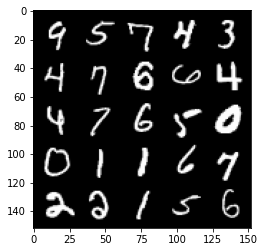

 84%|████████▍ | 393/469 [00:15<00:03, 24.04it/s]

Step 82000: Generator loss: 1.5152968344688407, discriminator loss: 0.4087896600961687


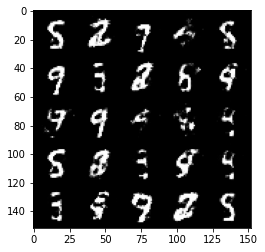

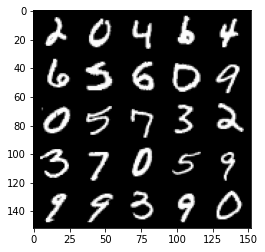

 90%|█████████ | 423/469 [00:17<00:01, 23.66it/s]

Step 82500: Generator loss: 1.55366066145897, discriminator loss: 0.39377962481975587


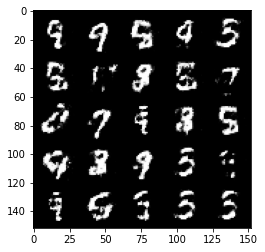

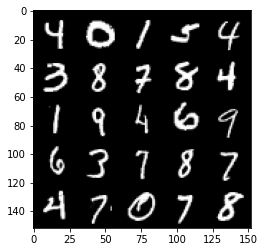

 97%|█████████▋| 456/469 [00:18<00:00, 25.58it/s]

Step 83000: Generator loss: 1.4786216070652003, discriminator loss: 0.4186055921316152


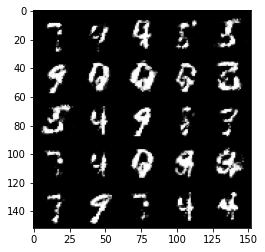

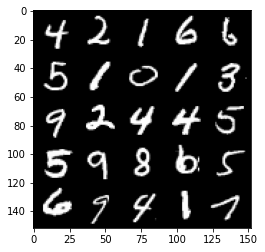

  4%|▍         | 18/469 [00:00<00:18, 25.01it/s]

Step 83500: Generator loss: 1.4903233792781836, discriminator loss: 0.41821487098932275


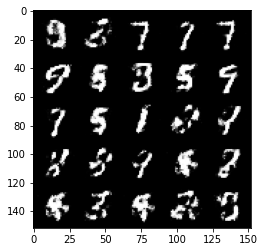

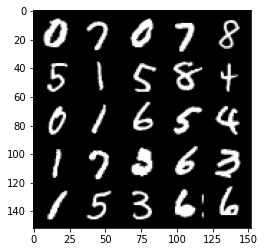

 10%|█         | 48/469 [00:01<00:15, 27.69it/s]

Step 84000: Generator loss: 1.463752276182175, discriminator loss: 0.4356714713573455


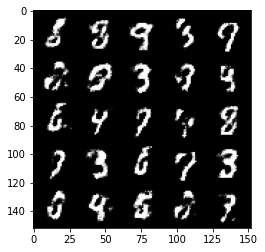

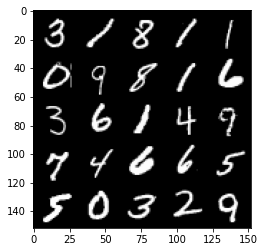

 17%|█▋        | 78/469 [00:02<00:15, 25.47it/s]

Step 84500: Generator loss: 1.4294031069278714, discriminator loss: 0.44276298242807394


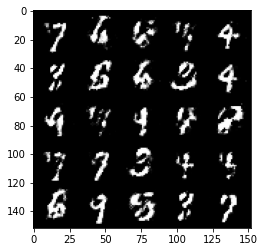

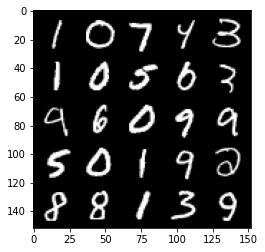

 23%|██▎       | 110/469 [00:04<00:13, 27.58it/s]

Step 85000: Generator loss: 1.2381907930374143, discriminator loss: 0.5563211708664894


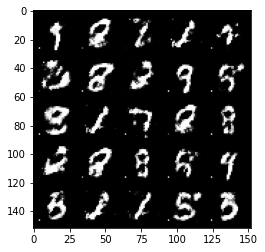

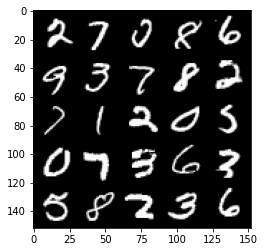

 30%|██▉       | 140/469 [00:05<00:17, 18.31it/s]

Step 85500: Generator loss: 1.5325755753517143, discriminator loss: 0.40093518906831765


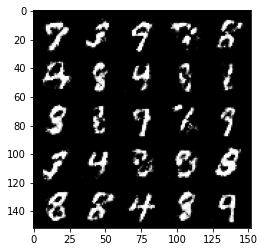

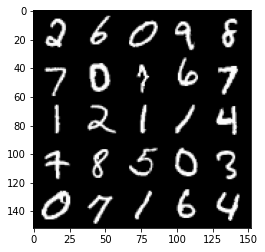

 37%|███▋      | 172/469 [00:07<00:13, 22.81it/s]

Step 86000: Generator loss: 1.447991403818131, discriminator loss: 0.42091608804464364


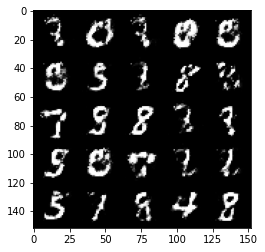

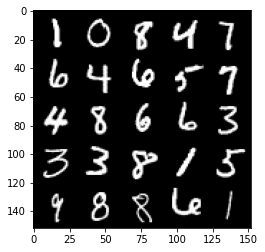

 43%|████▎     | 204/469 [00:08<00:12, 21.77it/s]

Step 86500: Generator loss: 1.4699004144668586, discriminator loss: 0.4247497026324272


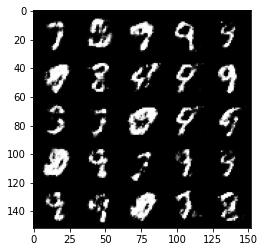

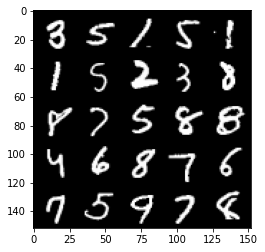

 50%|████▉     | 234/469 [00:09<00:09, 24.71it/s]

Step 87000: Generator loss: 1.4395728406906128, discriminator loss: 0.42335377150773984


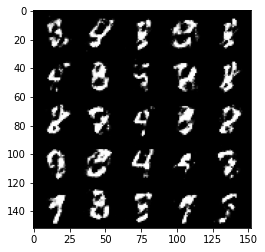

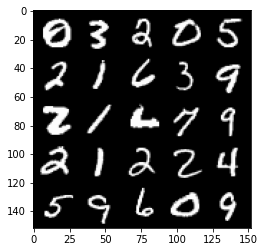

 56%|█████▋    | 264/469 [00:10<00:07, 26.80it/s]

Step 87500: Generator loss: 1.5155333240032212, discriminator loss: 0.4186928423643111


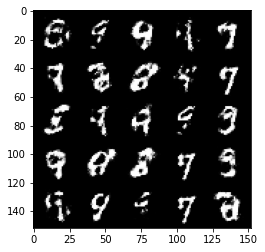

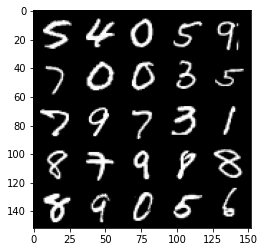

 63%|██████▎   | 297/469 [00:12<00:07, 23.42it/s]

Step 88000: Generator loss: 1.4506163842678075, discriminator loss: 0.42514607799053195


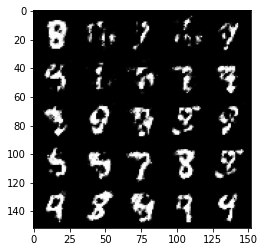

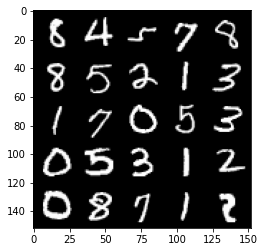

 70%|██████▉   | 326/469 [00:14<00:05, 23.91it/s]

Step 88500: Generator loss: 1.4121527776718141, discriminator loss: 0.43979201108217203


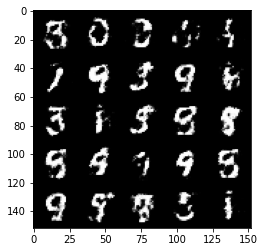

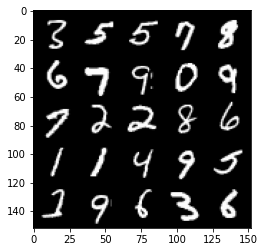

 76%|███████▋  | 358/469 [00:14<00:04, 27.00it/s]

Step 89000: Generator loss: 1.4187382380962381, discriminator loss: 0.43258900642395054


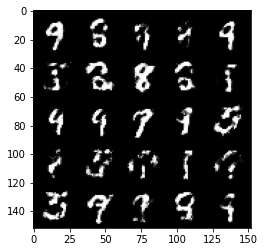

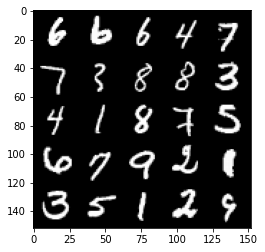

 83%|████████▎ | 390/469 [00:15<00:03, 23.52it/s]

Step 89500: Generator loss: 1.4843990476131443, discriminator loss: 0.3998984366655344


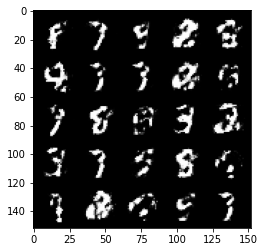

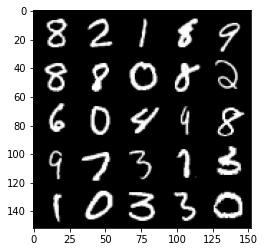

 90%|████████▉ | 420/469 [00:16<00:02, 22.94it/s]

Step 90000: Generator loss: 1.5784846711158749, discriminator loss: 0.4037426408529281


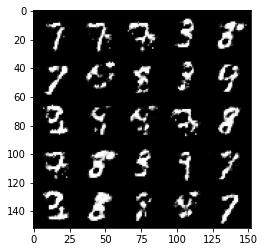

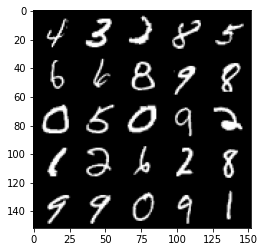

 96%|█████████▌| 450/469 [00:17<00:00, 26.89it/s]

Step 90500: Generator loss: 1.454686091661453, discriminator loss: 0.4257301666736599


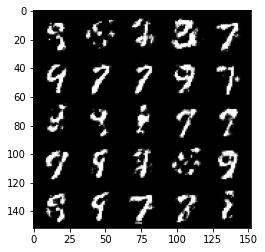

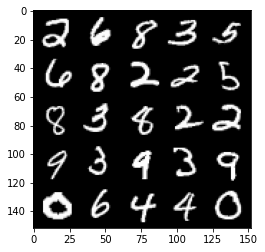

100%|█████████▉| 467/469 [00:18<00:00, 24.85it/s]


KeyboardInterrupt: 

In [24]:
for epoch in range(n_epochs): 
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()


        ### Update generator ###
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()


        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
